In [0]:
googlecolab = False

if googlecolab:
    from os.path import exists
    from wheel.pep425tags import get_abbr_impl, get_impl_ver, get_abi_tag
    platform = '{}{}-{}'.format(get_abbr_impl(), get_impl_ver(), get_abi_tag())
    cuda_output = !ldconfig -p|grep cudart.so|sed -e 's/.*\.\([0-9]*\)\.\([0-9]*\)$/cu\1\2/'
    accelerator = cuda_output[0] if exists('/dev/nvidia0') else 'cpu'

    !pip install -q http://download.pytorch.org/whl/{accelerator}/torch-0.4.1-{platform}-linux_x86_64.whl torchvision
    !pip install Pillow==4.1.1

In [0]:
%matplotlib inline
import argparse
import os
import random
import torch
import torch.nn as nn
import torch.nn.parallel
import torch.backends.cudnn as cudnn
import torch.optim as optim
import torch.utils.data
import torchvision.datasets as dset
import torchvision.transforms as transforms
import torchvision.utils as vutils
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
from IPython.display import HTML

## Hyperpameters

Define the hyperparameters. You can play with those later.

In [3]:
## Data loading

workers = 4 # Number of workers for dataloader (/!\ set to 4 when you're done debugging)

## Architecture

arch = 'cDCGAN' # or cGAN
nz = 100 # Size of z latent vector (i.e. size of generator input)µ
ndf = 32 # Base size of feature maps in discriminator
ngf = 32 # Base size of feature maps in generator

## Optimization

lrD = 0.0002 # Learning rate for the discriminator
lrG = 0.0002 # Learning rate for the generator
beta1G = 0.5 # Momentum beta1 for the discriminator
beta1D = 0.5 # Momentum beta1 for the generator

## Training

batch_size = 128 # Images per batch
nb_update_D = 1 # Number of sub-steps of discriminator optim. at each step
nb_update_G = 1 # Number of sub-steps of generator optim. at each step
#steps = 8000 # Number of global steps in the training loop
nb_epochs = 20 # Number of epochs, leave "None" if you want to set the number of "steps" (i.e. batches)


if nb_epochs is None:
    nb_epochs = (steps * batch_size) / (nb_update_D * 50000)
else:
    steps = int(nb_epochs * nb_update_D * 50000 / batch_size)
print("Doing %.1f epochs in %d steps" % (nb_epochs, steps))
steps_per_epoch = int(steps / nb_epochs)

Doing 20.0 epochs in 7812 steps


# Dataset

Download and load the dataset. Nothing to do here.

0it [00:00, ?it/s]

9920512it [00:01, 8194718.74it/s]                            


Extracting /tmp/mnist/MNIST/raw/train-images-idx3-ubyte.gz to /tmp/mnist/MNIST/raw


  0%|          | 0/28881 [00:00<?, ?it/s]

32768it [00:00, 121225.85it/s]           
  0%|          | 0/1648877 [00:00<?, ?it/s]

Extracting /tmp/mnist/MNIST/raw/train-labels-idx1-ubyte.gz to /tmp/mnist/MNIST/raw


1654784it [00:00, 1963581.93it/s]                           
0it [00:00, ?it/s]

Extracting /tmp/mnist/MNIST/raw/t10k-images-idx3-ubyte.gz to /tmp/mnist/MNIST/raw


8192it [00:00, 45827.40it/s]            


Extracting /tmp/mnist/MNIST/raw/t10k-labels-idx1-ubyte.gz to /tmp/mnist/MNIST/raw
Processing...
Done!


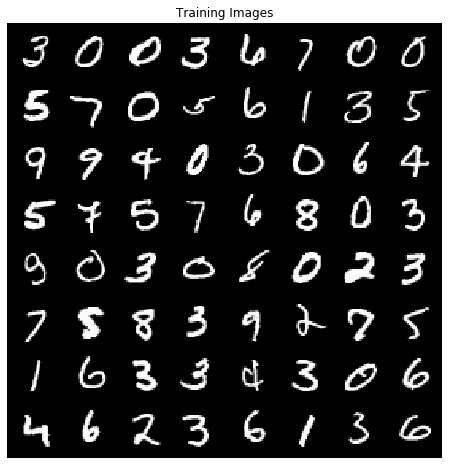

In [4]:
# We can use an image folder dataset the way we have it setup.
# Create the dataset
dataroot = '/tmp/mnist'
transform = transforms.Compose([
        transforms.Pad(2),
        transforms.ToTensor(),
        transforms.Normalize(mean=(0.5,), std=(0.5,))
])
dataset = dset.MNIST(dataroot, train=True, download=True, transform=transform)
# Create the dataloader
dataloader = torch.utils.data.DataLoader(dataset, batch_size=batch_size,
                                         shuffle=True, num_workers=workers)

# Decide which device we want to run on
device = torch.device("cuda:0" if torch.cuda.is_available() else "cpu")

# Plot some training images
real_batch = next(iter(dataloader))
plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Training Images")
plt.imshow(np.transpose(vutils.make_grid(real_batch[0].to(device)[:64], padding=2, normalize=True).cpu(),(1,2,0)))
plt.show()

# Model architectures

## Discriminator

Input: Image $x \in \mathbb{R}^{32\times 32\times 1}$  
Output: "Real" image probability $\in [0,1]$

## Generator

Input: Random "noise" $z \in \mathbb{R}^{\text{nz}}$  
Output: Generated image $\tilde x \in \mathbb{R}^{32\times 32\times 1}$


In [0]:
# cDCGAN

if arch == 'cDCGAN':
    
    class Discriminator(nn.Module):
        def __init__(self):
            super(Discriminator, self).__init__()
            self.emb_x = nn.Sequential(
                nn.Conv2d(1,64,kernel_size=4,stride=2,padding=1),
                nn.LeakyReLU(negative_slope=0.2)
            )
            self.emb_y = nn.Sequential(
                nn.Conv2d(10,64,kernel_size=4,stride=2,padding=1),
                nn.LeakyReLU(negative_slope=0.2)
            )
            self.emb_xy = nn.Sequential(
                nn.Conv2d(64+64,256,kernel_size=4,stride=2,padding=1,bias=False),
                nn.BatchNorm2d(256),
                nn.LeakyReLU(negative_slope=0.2),
                nn.Conv2d(256,512,kernel_size=4,stride=2,padding=1,bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2),
                nn.Conv2d(512,1,kernel_size=4,stride=1,padding=0,bias=False),
                nn.Sigmoid()
                
            )

        def forward(self, x, y):
            d_x=self.emb_x(x)
            y=y.repeat(32,32,1,1).view(x.shape[0],10,32,32)
            d_y=self.emb_y(y)
            xy=torch.cat((d_x,d_y),dim=1)
            out=self.emb_xy(xy)
            return out


    class Generator(nn.Module):
        def __init__(self):
            super(Generator, self).__init__()
            self.emb_z = nn.Sequential(
                nn.ConvTranspose2d(nz,256,kernel_size=4,stride=1,padding=0,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU()
            )
            self.emb_y = nn.Sequential(
                nn.ConvTranspose2d(10,256,kernel_size=4,stride=1,padding=0,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU()
            )
            self.emb_zy = nn.Sequential(
                nn.ConvTranspose2d(256+256,256,kernel_size=4,stride=2,padding=1,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU(),
                nn.ConvTranspose2d(256,128,kernel_size=4,stride=2,padding=1,bias=False),
                nn.BatchNorm2d(128),
                nn.ReLU(),
                nn.ConvTranspose2d(128,1,kernel_size=4,stride=2,padding=1),
                nn.Tanh()
            )

        def forward(self, z, y):
            d_z=self.emb_z(z)
            d_y=self.emb_y(y)
            zy=torch.cat((d_z,d_y),dim=1)
            out=self.emb_zy(zy)
            return out

In [0]:
# cGAN

if arch == 'cGAN':
    class PrintLayer(nn.Module):
      def __init__(self):
          super(PrintLayer, self).__init__()
    
      def forward(self, x):
          # Do your print / debug stuff here
          x = x.reshape(x.shape[0],x.shape[1],1,1)
          print(x.shape)
          return x
    
    class Discriminator(nn.Module):
        def __init__(self):
            super(Discriminator, self).__init__()
            self.emb_x = nn.Sequential(
                nn.Linear(32*32*1,1024),
                nn.LeakyReLU(negative_slope=0.2)
            )
            self.emb_y = nn.Sequential(
                nn.Linear(10,1024),
                nn.LeakyReLU(negative_slope=0.2)
            )
            self.emb_xy = nn.Sequential(
                nn.Linear(1024,1024,bias=False),
                nn.BatchNorm2d(1024),
                nn.LeakyReLU(negative_slope=0.2),
                nn.Linear(1024,512,bias=False),
                nn.BatchNorm2d(512),
                nn.LeakyReLU(negative_slope=0.2),
                nn.Linear(512,1),
                nn.Sigmoid()
            )

        def forward(self, x, y):
            d_x=self.emb_x(x)
            y=y.repeat(32,32,1,1).view(x.shape[0],10,32,32)
            d_y=self.emb_y(y)
            
            xy=torch.cat((d_x,d_y))
            out=self.emb_xy(xy)
            return out



    class Generator(nn.Module):
        def __init__(self):
            super(Generator, self).__init__()
            self.emb_z = nn.Sequential(
                nn.Linear(nz,256,bias=False),
                PrintLayer(),
                #Le problème est dans le batchNorm2d
                nn.BatchNorm2d(256),
                nn.ReLU()
            )
            self.emb_y = nn.Sequential(
                nn.Linear(nz,256,bias=False),
                nn.BatchNorm2d(256),
                nn.ReLU()
            )
            self.emb_zy = nn.Sequential(
                nn.Linear(256+256,512,bias=False),
                nn.BatchNorm2d(512),
                nn.ReLU(),
                nn.Linear(512,1024,bias=False),
                nn.BatchNorm2d(1024),
                nn.ReLU(),
                nn.Linear(1024,1024),
                nn.Tanh()

            )

        def forward(self, z, y):
            # Remove unused dimensions in non-conv model
            z = z.view(z.shape[0], -1) # z[:, :, 0, 0] #(batch_size, channel, size,size)
            y = y.view(y.shape[0], -1)
            print(z.shape)
            d_z=self.emb_z(z)
            d_y=self.emb_y(y)
            zy=torch.cat((d_z,d_y))
            out=self.emb_zy(zy)
            
            return out

In [7]:
# Create the models
netG = Generator().to(device)
netD = Discriminator().to(device)

# Apply the weights_init function to randomly initialize all weights to mean=0, stdev=0.2
def weights_init(m):
    classname = m.__class__.__name__
    if classname.find('Conv') != -1:
        nn.init.normal_(m.weight.data, 0.0, 0.02)
    elif classname.find('BatchNorm') != -1:
        nn.init.normal_(m.weight.data, 1.0, 0.02)
        nn.init.constant_(m.bias.data, 0)
netG.apply(weights_init)
netD.apply(weights_init)

# Print the models
print(netG)
print(netD)

Generator(
  (emb_z): Sequential(
    (0): ConvTranspose2d(100, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (emb_y): Sequential(
    (0): ConvTranspose2d(10, 256, kernel_size=(4, 4), stride=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
  )
  (emb_zy): Sequential(
    (0): ConvTranspose2d(512, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (2): ReLU()
    (3): ConvTranspose2d(256, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (4): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (5): ReLU()
    (6): ConvTranspose2d(128, 1, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1))
    (7): Tanh()
  )
)
Discriminator(
  (emb_

In [8]:
# TODO test you models to check if they 
z = torch.zeros(10, nz, 1, 1).to(device)
x = torch.zeros(10, 1, 32, 32).to(device)
y = torch.randn(10, 10, 1, 1).to(device)
print(netG(z, y).shape) # expected: [10, 1, 32, 32]
print(netD(x, y).shape) # expected: [10, 1, 1, 1]

torch.Size([10, 1, 32, 32])
torch.Size([10, 1, 1, 1])


# Optimization and training

Here we will define:
* Our prior $P(z)$ that we use to sample random "noise". We will use a Gaussian distribution.
* The criterion that will be used to train the discriminator, and indirectly the generator. We will use the binary cross-entropy.
* The optimizers of both models. We will use the Adam optimizer.

In [0]:
# Prior P(z). Returns a Gaussian random tensor of shape (batch_size, nz, 1, 1)
def get_noise(batch_size):
    noise = torch.randn((batch_size,nz,1,1))
    return noise

# Returns a random vector of one-hot encoding of shape (batch_size, 10, 1, 1)
def get_fixed_y(batch_size):
    y = torch.zeros(batch_size, 10, 1, 1, device=device)
    n = batch_size // 10
    for i in range(10):
        y[i*n:i*n+n, i, :, :].fill_(1)
    return y

# Create the criterion function that will take (y_hat, y) as input
criterion = nn.BCELoss()

# Setup Adam optimizers for D and G
optimizerD = torch.optim.Adam(netD.parameters(),lr=lrD,betas=(beta1D,beta1D))
optimizerG = torch.optim.Adam(netG.parameters(),lr=lrG,betas=(beta1G,beta1G))

### Data format / batch creation functions

`r_real` and `r_fake` are targets for the disriminator's criterion

In [0]:
# Data format / batch creation functions

fixed_noise = get_noise(100) # Create a fixed random vector sampled from a Gaussian, will be used during train for viz
fixed_y = get_fixed_y(100)
real_label = 1
fake_label = 0
iterator = iter(dataloader)

def onehot(data, nclass=10):
    bsize = data.shape[0]
    y = torch.zeros(bsize, nclass)
    y.scatter_(1, data.unsqueeze(1), 1)
    y = y.unsqueeze(2).unsqueeze(3)
    return y

# returns a batch of real images from the dataset (iterates infinitely on the dataset)
def get_batch_real():
    global iterator
    try:
        x_real, y_real = next(iterator)
    except:
        iterator = iter(dataloader)
        x_real, y_real = next(iterator)
    x_real = x_real.to(device)
    y_real = onehot(y_real).to(device)
    r_real = torch.full((x_real.size(0),), real_label, device=device)
    return x_real, y_real, r_real

# returns a batch of generated images and training targets y_fake
# Note that the targets y_fake will be different is train_G is True or False
def get_batch_fake(y_real, train_G=False):
    z = torch.randn(y_real.shape[0], nz, 1, 1, device=device)
    x_fake = netG(z, y_real)
    if train_G:
        r_fake = torch.full((x_fake.size(0),), real_label, device=device)
    else:
        r_fake = torch.full((x_fake.size(0),), fake_label, device=device)
    return x_fake, y_real, r_fake

### Training Loop

**Reminder:** when your training loop starts to work, change the `workers` variable to 4 and rerun your notebook

In [0]:
img_list = []
G_losses = []
D_losses = []

/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([128])) that is different to the input size (torch.Size([128, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[    0/ 7812]	Loss_D: 1.6537	Loss_G: 0.0043	D(x): 0.3066	D(G(z)): 0.2775


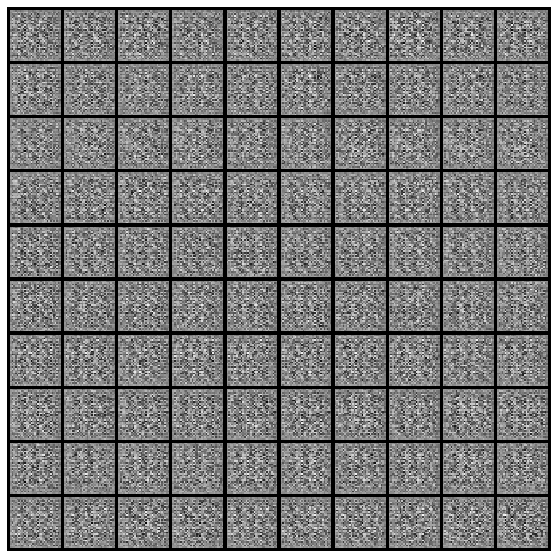

[   25/ 7812]	Loss_D: 0.2329	Loss_G: 1.0010	D(x): 0.8475	D(G(z)): 0.0511
[   50/ 7812]	Loss_D: 2.2631	Loss_G: 1.1493	D(x): 0.3604	D(G(z)): 0.1403
[   75/ 7812]	Loss_D: 0.7111	Loss_G: 11.0180	D(x): 0.9847	D(G(z)): 0.3421
[  100/ 7812]	Loss_D: 0.0268	Loss_G: 9.7730	D(x): 0.9898	D(G(z)): 0.0158


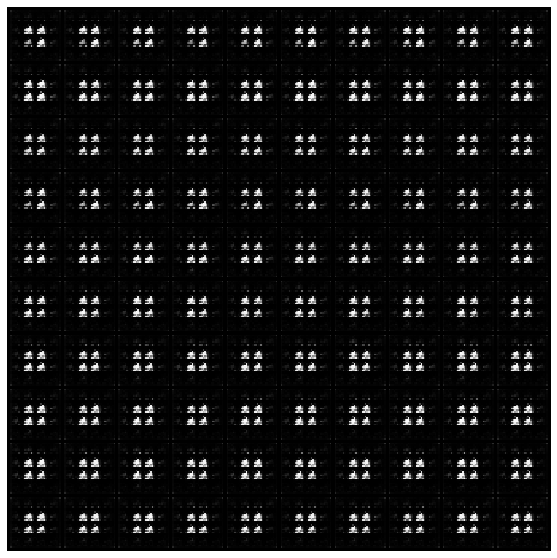

[  125/ 7812]	Loss_D: 1.1448	Loss_G: 8.1767	D(x): 0.9446	D(G(z)): 0.5585
[  150/ 7812]	Loss_D: 1.1461	Loss_G: 7.6378	D(x): 0.9384	D(G(z)): 0.5886
[  175/ 7812]	Loss_D: 1.1287	Loss_G: 5.3143	D(x): 0.8122	D(G(z)): 0.4497
[  200/ 7812]	Loss_D: 0.6612	Loss_G: 4.3714	D(x): 0.8119	D(G(z)): 0.2101


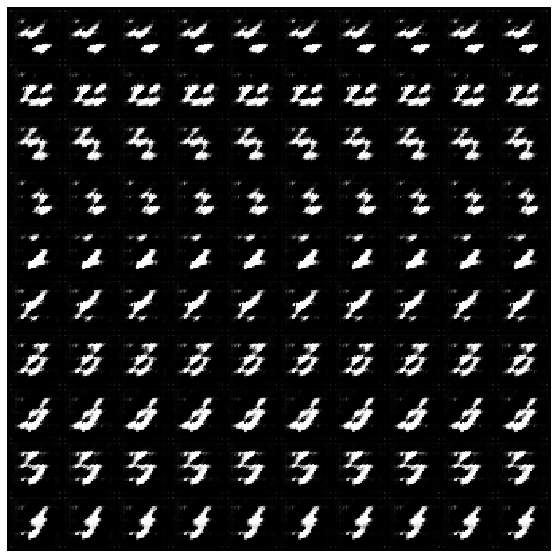

[  225/ 7812]	Loss_D: 0.5779	Loss_G: 2.8593	D(x): 0.8106	D(G(z)): 0.2078
[  250/ 7812]	Loss_D: 1.1297	Loss_G: 5.2572	D(x): 0.8893	D(G(z)): 0.4909
[  275/ 7812]	Loss_D: 0.9913	Loss_G: 1.0479	D(x): 0.5771	D(G(z)): 0.1758
[  300/ 7812]	Loss_D: 1.6971	Loss_G: 0.4084	D(x): 0.3942	D(G(z)): 0.1800


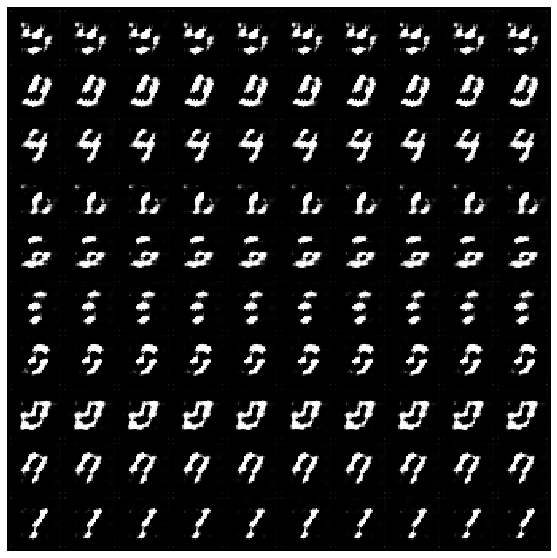

[  325/ 7812]	Loss_D: 1.9889	Loss_G: 2.1821	D(x): 0.8398	D(G(z)): 0.7710
[  350/ 7812]	Loss_D: 0.9297	Loss_G: 1.7870	D(x): 0.8120	D(G(z)): 0.4481
[  375/ 7812]	Loss_D: 1.5458	Loss_G: 2.7454	D(x): 0.8783	D(G(z)): 0.6783
[  400/ 7812]	Loss_D: 1.1007	Loss_G: 0.7796	D(x): 0.5365	D(G(z)): 0.2266


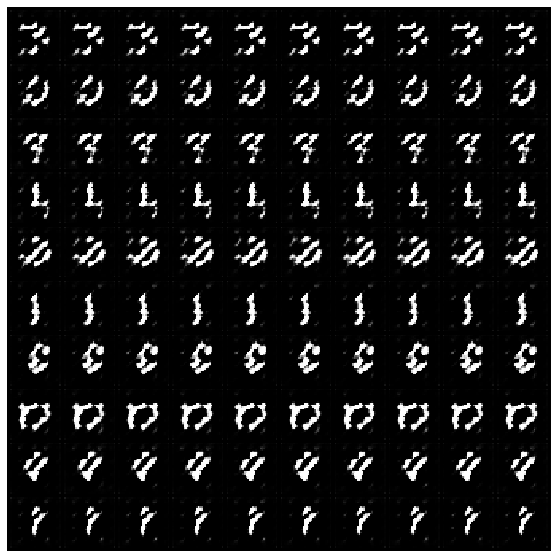

[  425/ 7812]	Loss_D: 1.0119	Loss_G: 1.8074	D(x): 0.5557	D(G(z)): 0.1852
[  450/ 7812]	Loss_D: 1.1764	Loss_G: 1.5957	D(x): 0.6349	D(G(z)): 0.3771


/usr/local/lib/python3.6/dist-packages/torch/nn/modules/loss.py:498: UserWarning: Using a target size (torch.Size([96])) that is different to the input size (torch.Size([96, 1, 1, 1])) is deprecated. Please ensure they have the same size.
  return F.binary_cross_entropy(input, target, weight=self.weight, reduction=self.reduction)


[  475/ 7812]	Loss_D: 0.5472	Loss_G: 2.1084	D(x): 0.7828	D(G(z)): 0.1883
[  500/ 7812]	Loss_D: 1.5759	Loss_G: 2.0174	D(x): 0.8902	D(G(z)): 0.7230


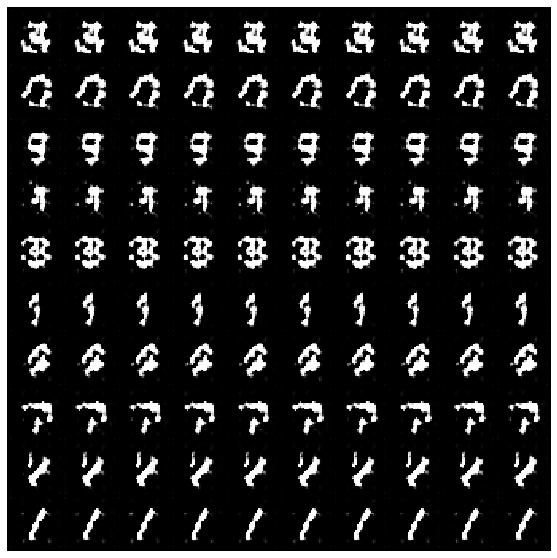

[  525/ 7812]	Loss_D: 0.7687	Loss_G: 2.9165	D(x): 0.6715	D(G(z)): 0.2106
[  550/ 7812]	Loss_D: 0.8019	Loss_G: 1.0407	D(x): 0.6627	D(G(z)): 0.2063
[  575/ 7812]	Loss_D: 1.2977	Loss_G: 2.7761	D(x): 0.9272	D(G(z)): 0.6706
[  600/ 7812]	Loss_D: 1.0891	Loss_G: 0.8893	D(x): 0.5437	D(G(z)): 0.1698


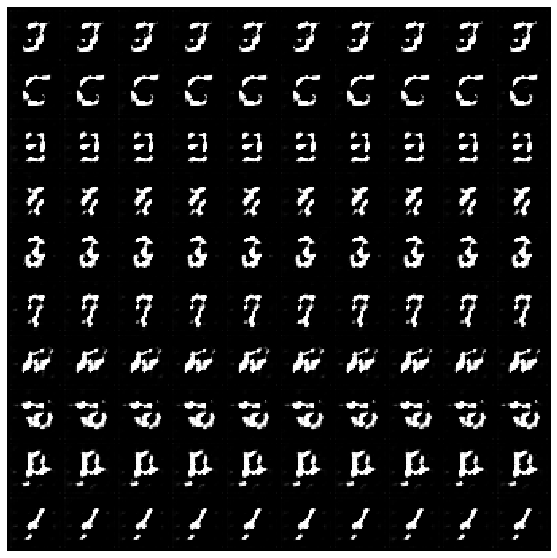

[  625/ 7812]	Loss_D: 0.5912	Loss_G: 1.8353	D(x): 0.7244	D(G(z)): 0.1697
[  650/ 7812]	Loss_D: 0.8352	Loss_G: 1.8723	D(x): 0.6132	D(G(z)): 0.1060
[  675/ 7812]	Loss_D: 1.0001	Loss_G: 1.2553	D(x): 0.5932	D(G(z)): 0.1627
[  700/ 7812]	Loss_D: 0.5232	Loss_G: 2.3480	D(x): 0.7698	D(G(z)): 0.1418


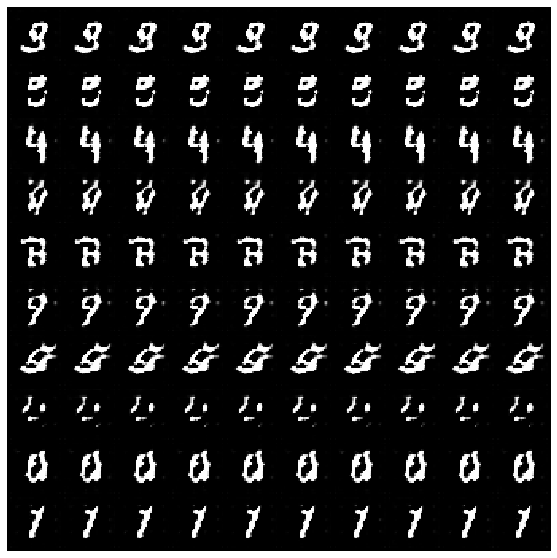

[  725/ 7812]	Loss_D: 0.6882	Loss_G: 3.0911	D(x): 0.8426	D(G(z)): 0.3604
[  750/ 7812]	Loss_D: 0.7479	Loss_G: 3.1011	D(x): 0.8592	D(G(z)): 0.4018
[  775/ 7812]	Loss_D: 0.8309	Loss_G: 1.7287	D(x): 0.6097	D(G(z)): 0.0792
[  800/ 7812]	Loss_D: 0.6833	Loss_G: 4.4383	D(x): 0.9120	D(G(z)): 0.4082


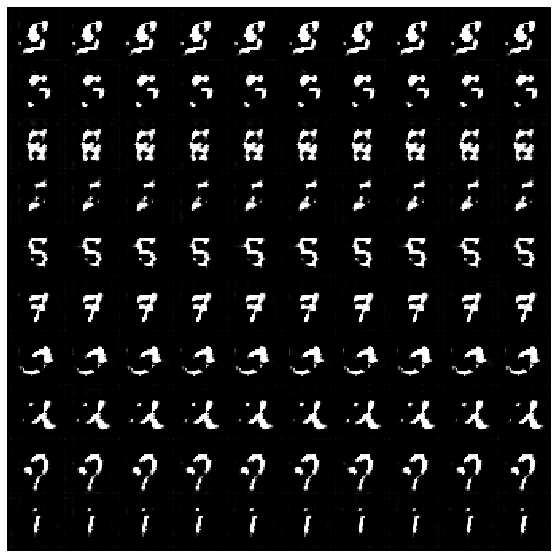

[  825/ 7812]	Loss_D: 0.6055	Loss_G: 2.3624	D(x): 0.7109	D(G(z)): 0.0929
[  850/ 7812]	Loss_D: 0.5438	Loss_G: 3.8222	D(x): 0.7952	D(G(z)): 0.1953
[  875/ 7812]	Loss_D: 0.3189	Loss_G: 4.2649	D(x): 0.9057	D(G(z)): 0.1704
[  900/ 7812]	Loss_D: 0.7517	Loss_G: 1.4587	D(x): 0.6561	D(G(z)): 0.0857


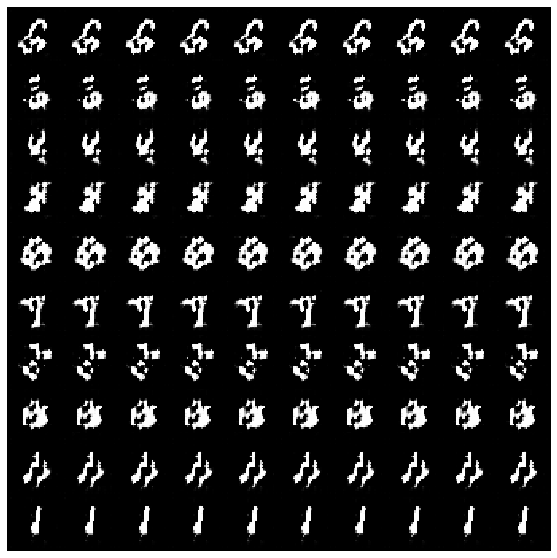

[  925/ 7812]	Loss_D: 0.4183	Loss_G: 1.9565	D(x): 0.7791	D(G(z)): 0.0696
[  950/ 7812]	Loss_D: 0.3570	Loss_G: 2.8487	D(x): 0.8402	D(G(z)): 0.1315
[  975/ 7812]	Loss_D: 0.5096	Loss_G: 4.0634	D(x): 0.7629	D(G(z)): 0.0580
[ 1000/ 7812]	Loss_D: 0.4187	Loss_G: 2.9864	D(x): 0.8539	D(G(z)): 0.1507


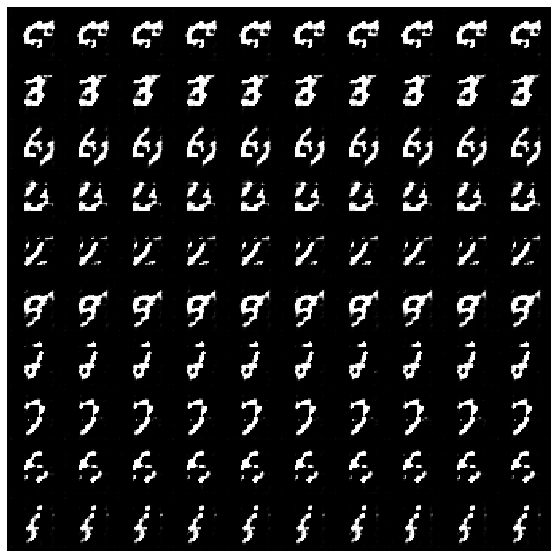

[ 1025/ 7812]	Loss_D: 0.3838	Loss_G: 2.9621	D(x): 0.8331	D(G(z)): 0.1073
[ 1050/ 7812]	Loss_D: 0.5332	Loss_G: 2.8559	D(x): 0.7413	D(G(z)): 0.0995
[ 1075/ 7812]	Loss_D: 0.7579	Loss_G: 2.3653	D(x): 0.6774	D(G(z)): 0.1228
[ 1100/ 7812]	Loss_D: 0.4789	Loss_G: 3.6574	D(x): 0.8609	D(G(z)): 0.2381


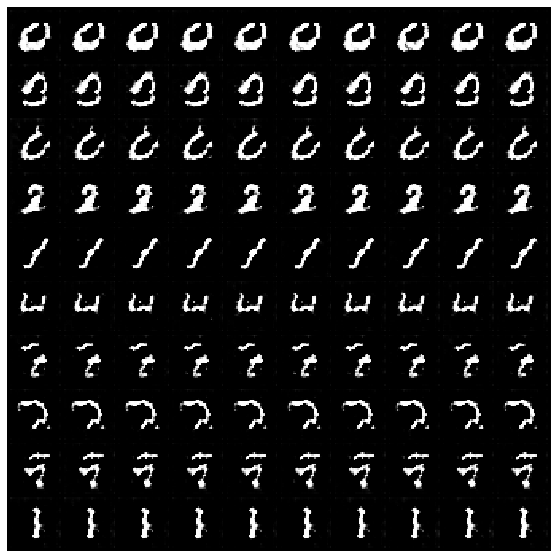

[ 1125/ 7812]	Loss_D: 0.4054	Loss_G: 3.5001	D(x): 0.8695	D(G(z)): 0.1826
[ 1150/ 7812]	Loss_D: 0.5183	Loss_G: 2.8296	D(x): 0.7396	D(G(z)): 0.0897
[ 1175/ 7812]	Loss_D: 0.7698	Loss_G: 3.7034	D(x): 0.9361	D(G(z)): 0.4786
[ 1200/ 7812]	Loss_D: 0.4575	Loss_G: 4.0417	D(x): 0.8958	D(G(z)): 0.2384


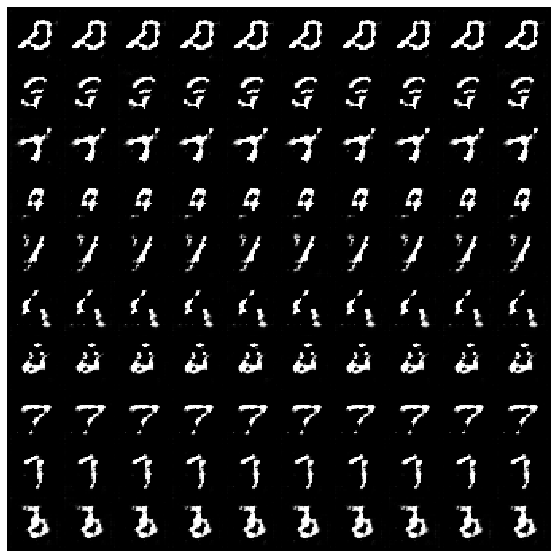

[ 1225/ 7812]	Loss_D: 0.6296	Loss_G: 3.2196	D(x): 0.6818	D(G(z)): 0.0677
[ 1250/ 7812]	Loss_D: 0.5009	Loss_G: 2.4125	D(x): 0.7768	D(G(z)): 0.1367
[ 1275/ 7812]	Loss_D: 0.5102	Loss_G: 2.6067	D(x): 0.7285	D(G(z)): 0.0295
[ 1300/ 7812]	Loss_D: 1.2753	Loss_G: 3.7902	D(x): 0.9435	D(G(z)): 0.6444


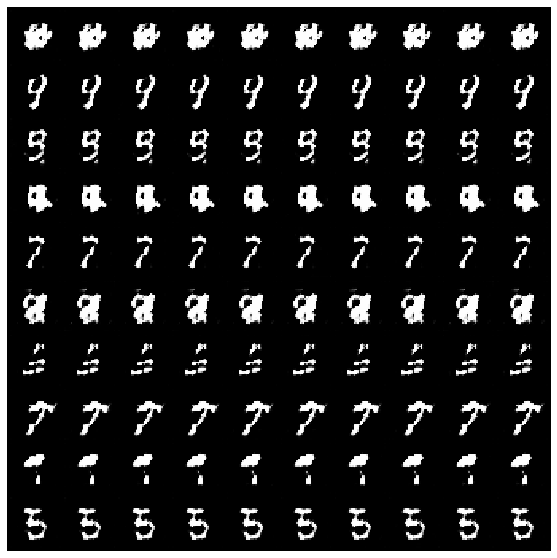

[ 1325/ 7812]	Loss_D: 0.3996	Loss_G: 4.5431	D(x): 0.8892	D(G(z)): 0.1970
[ 1350/ 7812]	Loss_D: 0.7003	Loss_G: 4.2011	D(x): 0.8289	D(G(z)): 0.2658
[ 1375/ 7812]	Loss_D: 0.3363	Loss_G: 2.0068	D(x): 0.8425	D(G(z)): 0.1044
[ 1400/ 7812]	Loss_D: 0.6117	Loss_G: 3.5678	D(x): 0.7566	D(G(z)): 0.1654


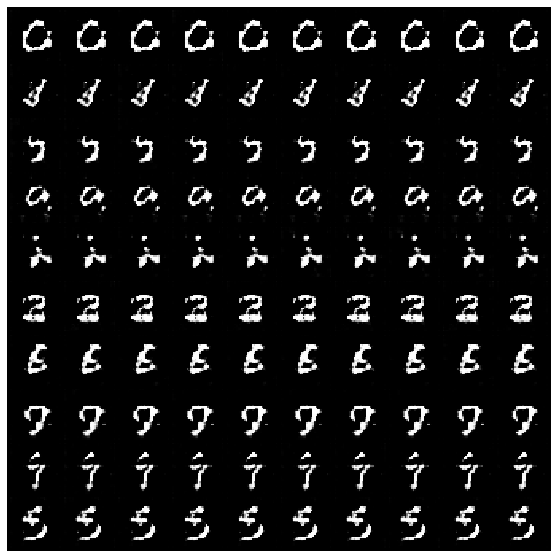

[ 1425/ 7812]	Loss_D: 0.5020	Loss_G: 2.9609	D(x): 0.7986	D(G(z)): 0.0885
[ 1450/ 7812]	Loss_D: 0.4540	Loss_G: 4.2473	D(x): 0.8681	D(G(z)): 0.2156
[ 1475/ 7812]	Loss_D: 0.5030	Loss_G: 2.7452	D(x): 0.7392	D(G(z)): 0.0758
[ 1500/ 7812]	Loss_D: 1.0770	Loss_G: 3.1427	D(x): 0.9142	D(G(z)): 0.5694


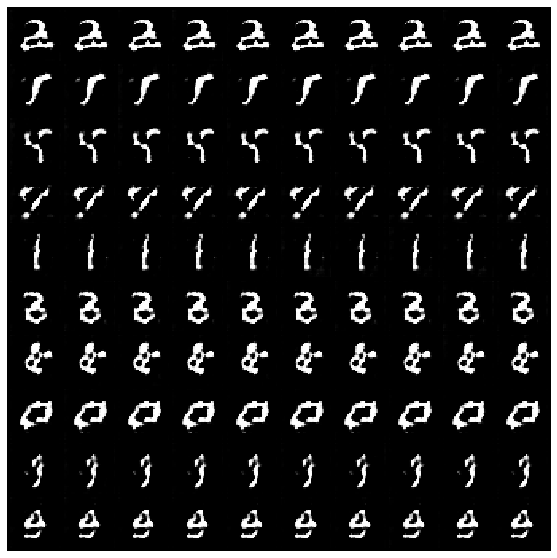

[ 1525/ 7812]	Loss_D: 0.6971	Loss_G: 3.6479	D(x): 0.9332	D(G(z)): 0.4083
[ 1550/ 7812]	Loss_D: 1.0419	Loss_G: 1.8206	D(x): 0.5618	D(G(z)): 0.0555
[ 1575/ 7812]	Loss_D: 0.7844	Loss_G: 4.6340	D(x): 0.8880	D(G(z)): 0.4235
[ 1600/ 7812]	Loss_D: 0.6355	Loss_G: 2.8031	D(x): 0.7347	D(G(z)): 0.1506


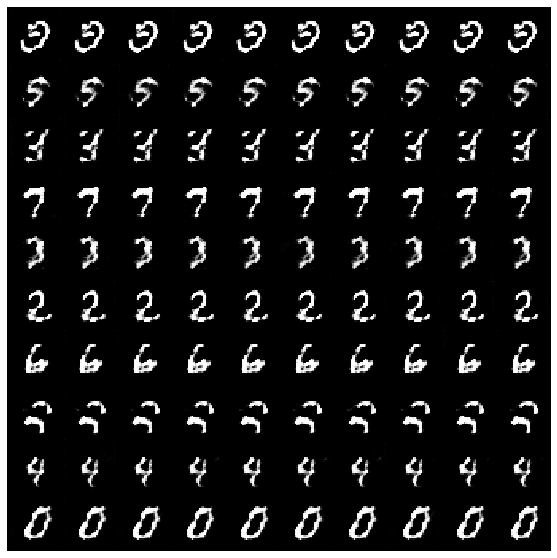

[ 1625/ 7812]	Loss_D: 0.3374	Loss_G: 3.6774	D(x): 0.8215	D(G(z)): 0.0532
[ 1650/ 7812]	Loss_D: 0.6195	Loss_G: 3.7176	D(x): 0.8172	D(G(z)): 0.2280
[ 1675/ 7812]	Loss_D: 0.3298	Loss_G: 2.0276	D(x): 0.8387	D(G(z)): 0.0624
[ 1700/ 7812]	Loss_D: 0.7308	Loss_G: 2.0080	D(x): 0.7063	D(G(z)): 0.0665


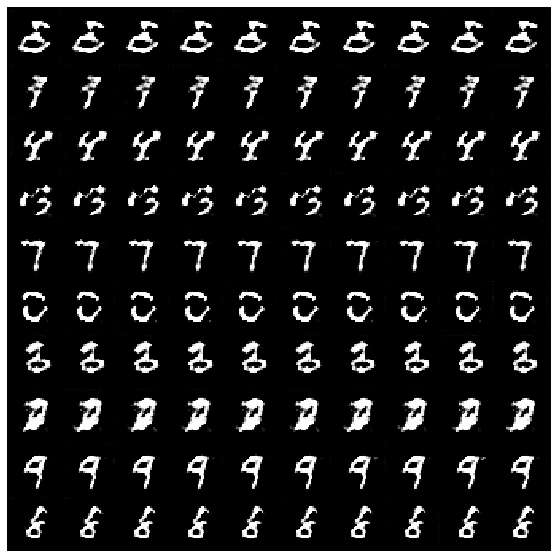

[ 1725/ 7812]	Loss_D: 0.9193	Loss_G: 3.2036	D(x): 0.8447	D(G(z)): 0.4664
[ 1750/ 7812]	Loss_D: 0.5749	Loss_G: 2.6958	D(x): 0.8567	D(G(z)): 0.2732
[ 1775/ 7812]	Loss_D: 0.5483	Loss_G: 2.0861	D(x): 0.7221	D(G(z)): 0.0557
[ 1800/ 7812]	Loss_D: 0.3180	Loss_G: 3.1346	D(x): 0.8729	D(G(z)): 0.1110


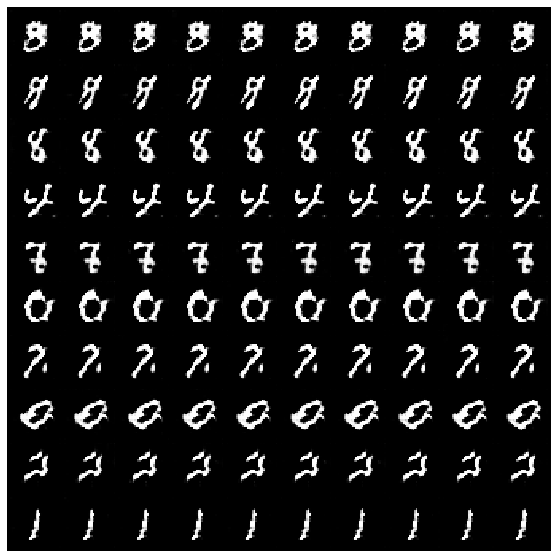

[ 1825/ 7812]	Loss_D: 0.5359	Loss_G: 1.9433	D(x): 0.8179	D(G(z)): 0.2100
[ 1850/ 7812]	Loss_D: 0.4307	Loss_G: 3.5480	D(x): 0.9217	D(G(z)): 0.2612
[ 1875/ 7812]	Loss_D: 0.2343	Loss_G: 1.8483	D(x): 0.8572	D(G(z)): 0.0306
[ 1900/ 7812]	Loss_D: 0.6983	Loss_G: 1.3974	D(x): 0.7392	D(G(z)): 0.1693


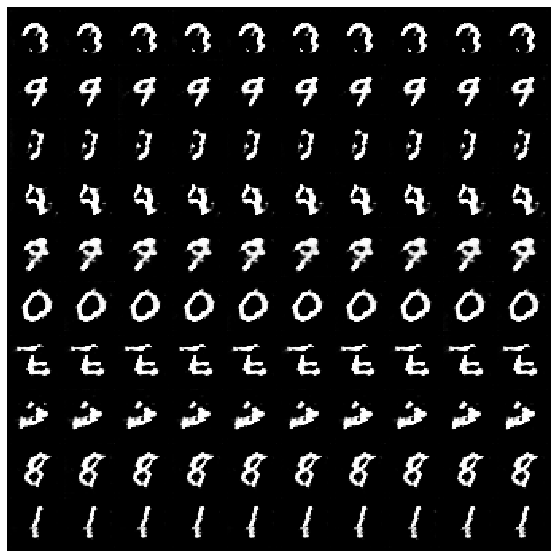

[ 1925/ 7812]	Loss_D: 0.4700	Loss_G: 3.0087	D(x): 0.8018	D(G(z)): 0.1146
[ 1950/ 7812]	Loss_D: 0.4760	Loss_G: 1.3080	D(x): 0.7924	D(G(z)): 0.1254
[ 1975/ 7812]	Loss_D: 0.4690	Loss_G: 3.6998	D(x): 0.9641	D(G(z)): 0.3313
[ 2000/ 7812]	Loss_D: 0.3536	Loss_G: 3.4562	D(x): 0.8358	D(G(z)): 0.1104


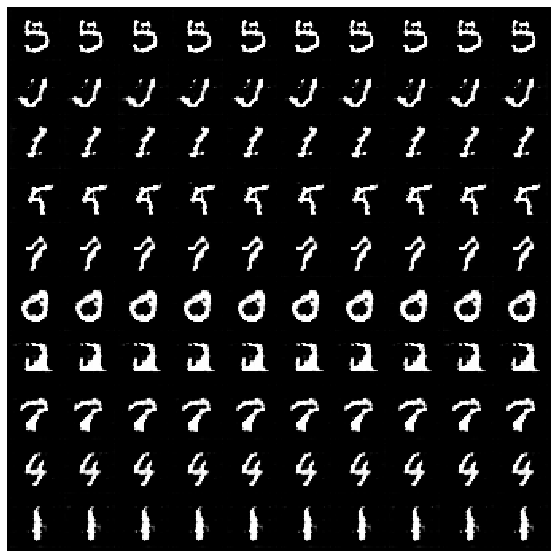

[ 2025/ 7812]	Loss_D: 0.3727	Loss_G: 1.9010	D(x): 0.8185	D(G(z)): 0.0941
[ 2050/ 7812]	Loss_D: 0.4267	Loss_G: 2.9663	D(x): 0.8100	D(G(z)): 0.0888
[ 2075/ 7812]	Loss_D: 0.8124	Loss_G: 3.7632	D(x): 0.9226	D(G(z)): 0.4390
[ 2100/ 7812]	Loss_D: 0.5346	Loss_G: 3.8230	D(x): 0.9136	D(G(z)): 0.3341


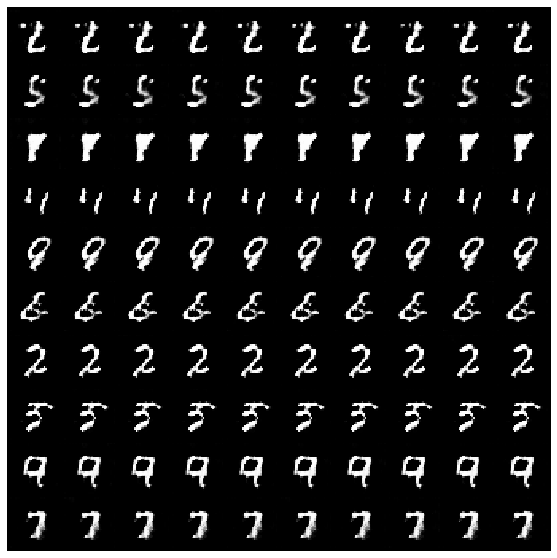

[ 2125/ 7812]	Loss_D: 0.3273	Loss_G: 2.7421	D(x): 0.8703	D(G(z)): 0.1002
[ 2150/ 7812]	Loss_D: 0.5368	Loss_G: 2.4951	D(x): 0.7651	D(G(z)): 0.1592
[ 2175/ 7812]	Loss_D: 0.6211	Loss_G: 1.7550	D(x): 0.7016	D(G(z)): 0.0674
[ 2200/ 7812]	Loss_D: 0.4625	Loss_G: 4.9027	D(x): 0.9130	D(G(z)): 0.2601


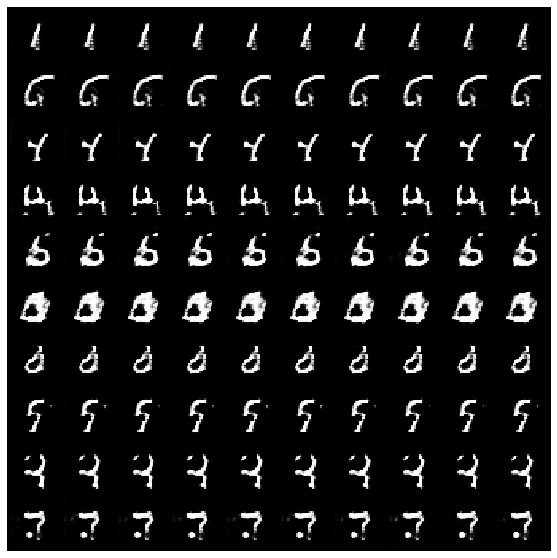

[ 2225/ 7812]	Loss_D: 0.5418	Loss_G: 3.5790	D(x): 0.7534	D(G(z)): 0.1039
[ 2250/ 7812]	Loss_D: 0.5909	Loss_G: 4.0870	D(x): 0.8752	D(G(z)): 0.2568
[ 2275/ 7812]	Loss_D: 0.7837	Loss_G: 3.7624	D(x): 0.9346	D(G(z)): 0.4123
[ 2300/ 7812]	Loss_D: 0.4192	Loss_G: 3.1662	D(x): 0.7824	D(G(z)): 0.0481


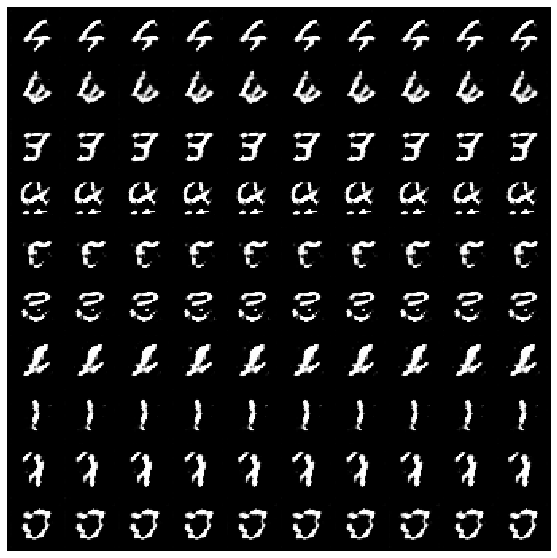

[ 2325/ 7812]	Loss_D: 0.2516	Loss_G: 4.2733	D(x): 0.8812	D(G(z)): 0.0669
[ 2350/ 7812]	Loss_D: 0.4017	Loss_G: 4.6060	D(x): 0.9169	D(G(z)): 0.2404
[ 2375/ 7812]	Loss_D: 0.7194	Loss_G: 2.5941	D(x): 0.8205	D(G(z)): 0.2928
[ 2400/ 7812]	Loss_D: 0.9562	Loss_G: 1.2481	D(x): 0.6080	D(G(z)): 0.1025


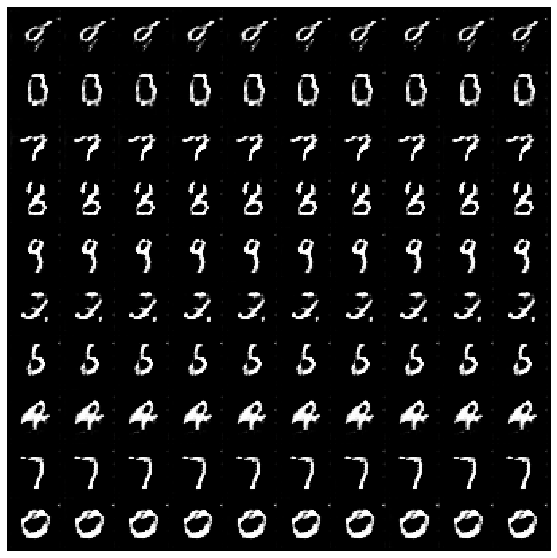

[ 2425/ 7812]	Loss_D: 0.7213	Loss_G: 4.4834	D(x): 0.9386	D(G(z)): 0.4661
[ 2450/ 7812]	Loss_D: 0.3006	Loss_G: 2.5670	D(x): 0.8294	D(G(z)): 0.0456
[ 2475/ 7812]	Loss_D: 0.5531	Loss_G: 2.2460	D(x): 0.7964	D(G(z)): 0.1780
[ 2500/ 7812]	Loss_D: 0.7046	Loss_G: 1.7603	D(x): 0.6572	D(G(z)): 0.0298


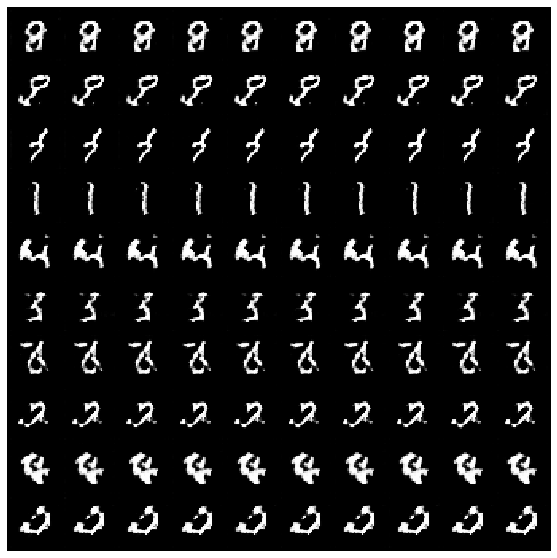

[ 2525/ 7812]	Loss_D: 0.8812	Loss_G: 1.7651	D(x): 0.6077	D(G(z)): 0.0557
[ 2550/ 7812]	Loss_D: 0.5679	Loss_G: 0.9851	D(x): 0.7402	D(G(z)): 0.1292
[ 2575/ 7812]	Loss_D: 0.5154	Loss_G: 3.7418	D(x): 0.8973	D(G(z)): 0.3061
[ 2600/ 7812]	Loss_D: 0.5031	Loss_G: 3.1553	D(x): 0.7899	D(G(z)): 0.1454


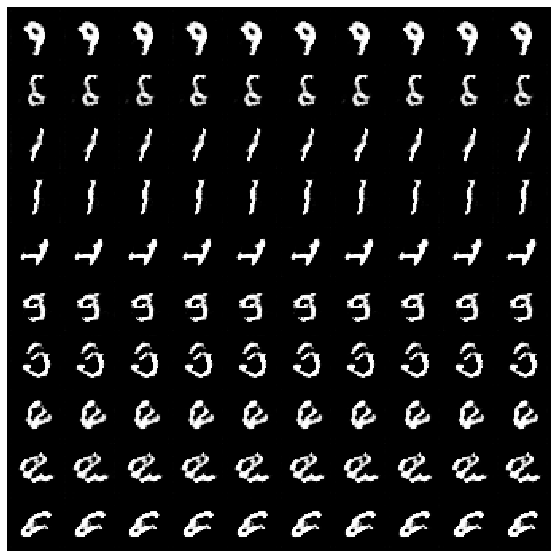

[ 2625/ 7812]	Loss_D: 0.3614	Loss_G: 4.9145	D(x): 0.9296	D(G(z)): 0.2203
[ 2650/ 7812]	Loss_D: 0.8603	Loss_G: 3.9560	D(x): 0.8889	D(G(z)): 0.4666
[ 2675/ 7812]	Loss_D: 0.5556	Loss_G: 0.9827	D(x): 0.7247	D(G(z)): 0.0681
[ 2700/ 7812]	Loss_D: 0.5611	Loss_G: 4.3424	D(x): 0.9094	D(G(z)): 0.3324


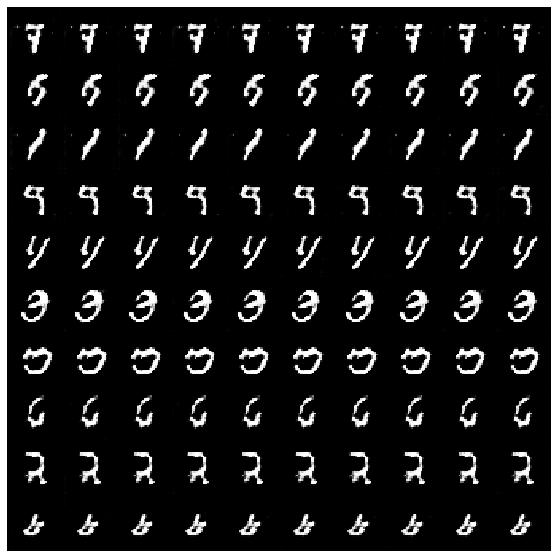

[ 2725/ 7812]	Loss_D: 1.0017	Loss_G: 3.3607	D(x): 0.9597	D(G(z)): 0.5942
[ 2750/ 7812]	Loss_D: 0.4379	Loss_G: 3.1706	D(x): 0.7409	D(G(z)): 0.0428
[ 2775/ 7812]	Loss_D: 0.5846	Loss_G: 3.6558	D(x): 0.8122	D(G(z)): 0.2133
[ 2800/ 7812]	Loss_D: 0.5406	Loss_G: 2.9127	D(x): 0.7495	D(G(z)): 0.1454


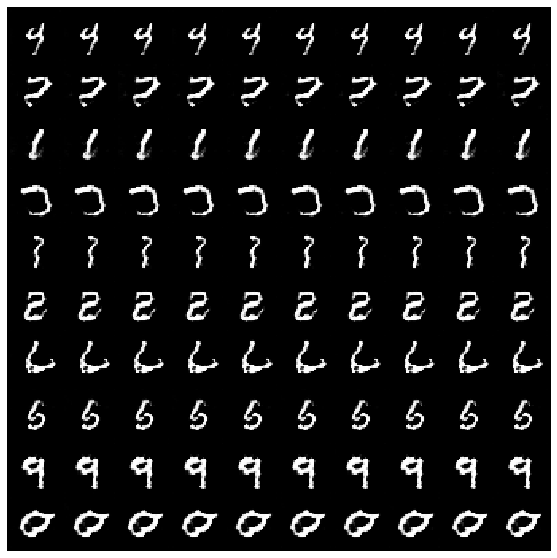

[ 2825/ 7812]	Loss_D: 0.3621	Loss_G: 5.0006	D(x): 0.8972	D(G(z)): 0.1897
[ 2850/ 7812]	Loss_D: 0.4673	Loss_G: 3.9266	D(x): 0.8987	D(G(z)): 0.2622
[ 2875/ 7812]	Loss_D: 0.4795	Loss_G: 1.1422	D(x): 0.7743	D(G(z)): 0.0886
[ 2900/ 7812]	Loss_D: 0.4476	Loss_G: 3.2203	D(x): 0.7932	D(G(z)): 0.1064


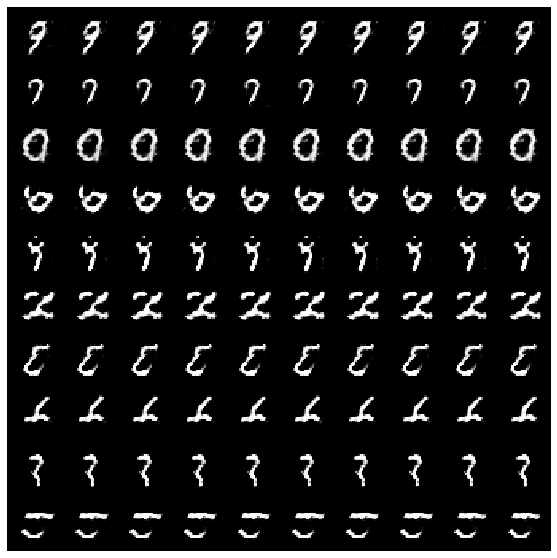

[ 2925/ 7812]	Loss_D: 0.9196	Loss_G: 2.5350	D(x): 0.5704	D(G(z)): 0.0305
[ 2950/ 7812]	Loss_D: 0.5502	Loss_G: 4.8135	D(x): 0.8984	D(G(z)): 0.3130
[ 2975/ 7812]	Loss_D: 0.6523	Loss_G: 3.4052	D(x): 0.8810	D(G(z)): 0.3688
[ 3000/ 7812]	Loss_D: 0.6012	Loss_G: 3.2585	D(x): 0.6742	D(G(z)): 0.0471


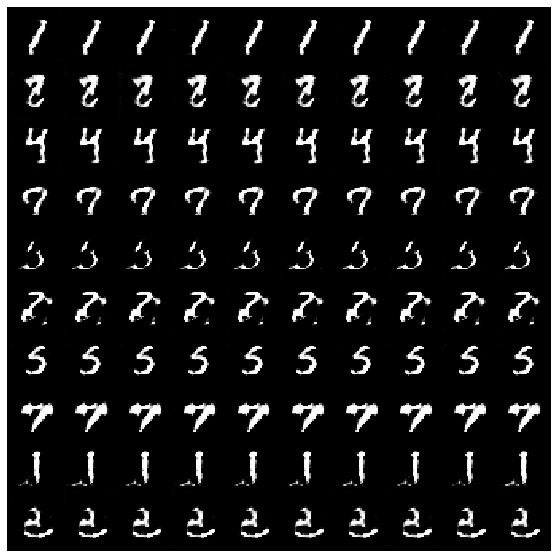

[ 3025/ 7812]	Loss_D: 0.5388	Loss_G: 2.3038	D(x): 0.8120	D(G(z)): 0.1748
[ 3050/ 7812]	Loss_D: 0.4805	Loss_G: 3.8514	D(x): 0.8412	D(G(z)): 0.2052
[ 3075/ 7812]	Loss_D: 0.7345	Loss_G: 4.1070	D(x): 0.8263	D(G(z)): 0.3243
[ 3100/ 7812]	Loss_D: 0.8850	Loss_G: 2.0119	D(x): 0.5875	D(G(z)): 0.0215


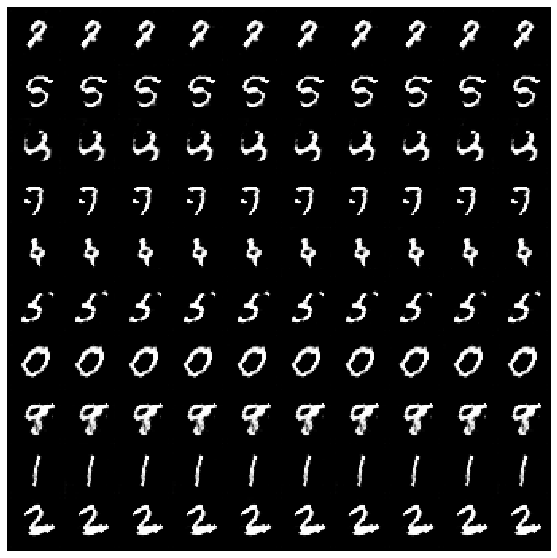

[ 3125/ 7812]	Loss_D: 0.5030	Loss_G: 1.7642	D(x): 0.7805	D(G(z)): 0.0914
[ 3150/ 7812]	Loss_D: 0.6544	Loss_G: 4.2241	D(x): 0.9203	D(G(z)): 0.3760
[ 3175/ 7812]	Loss_D: 0.2507	Loss_G: 3.2021	D(x): 0.8702	D(G(z)): 0.0466
[ 3200/ 7812]	Loss_D: 0.2524	Loss_G: 1.8125	D(x): 0.8695	D(G(z)): 0.0571


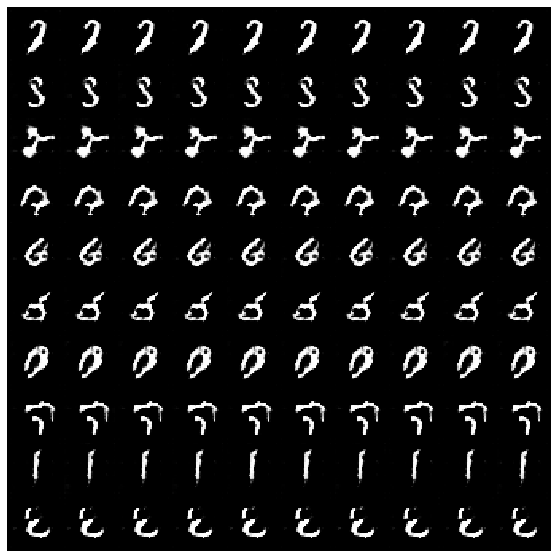

[ 3225/ 7812]	Loss_D: 0.3417	Loss_G: 5.0138	D(x): 0.8180	D(G(z)): 0.0358
[ 3250/ 7812]	Loss_D: 0.5978	Loss_G: 3.5919	D(x): 0.9283	D(G(z)): 0.3812
[ 3275/ 7812]	Loss_D: 0.3345	Loss_G: 2.9630	D(x): 0.9288	D(G(z)): 0.1912
[ 3300/ 7812]	Loss_D: 0.3354	Loss_G: 4.2296	D(x): 0.9033	D(G(z)): 0.1768


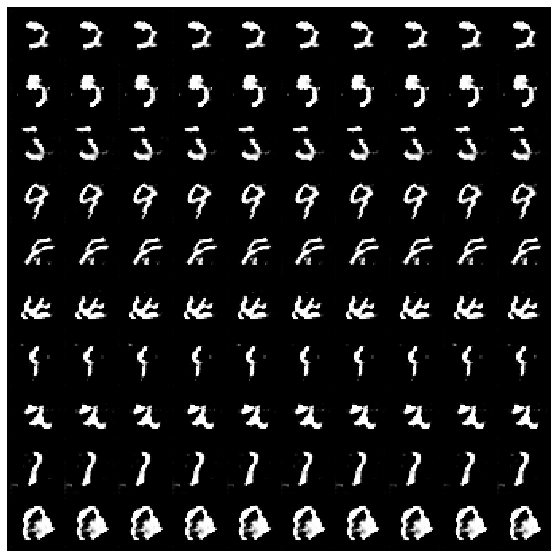

[ 3325/ 7812]	Loss_D: 0.7931	Loss_G: 3.5938	D(x): 0.8629	D(G(z)): 0.3920
[ 3350/ 7812]	Loss_D: 0.6300	Loss_G: 3.9321	D(x): 0.9030	D(G(z)): 0.3757
[ 3375/ 7812]	Loss_D: 0.5002	Loss_G: 2.1801	D(x): 0.8285	D(G(z)): 0.1802
[ 3400/ 7812]	Loss_D: 0.7597	Loss_G: 4.1503	D(x): 0.8718	D(G(z)): 0.4059


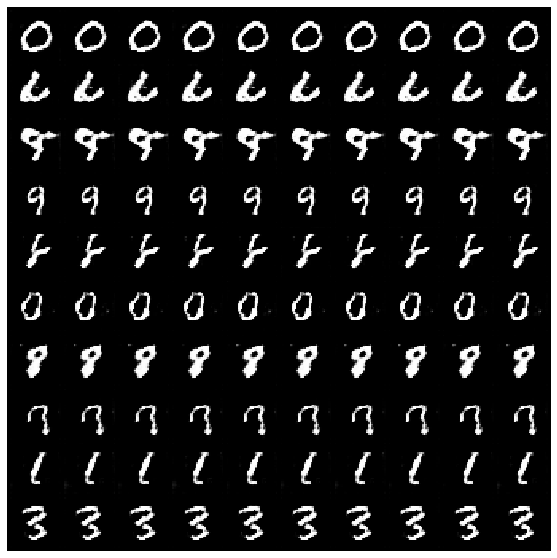

[ 3425/ 7812]	Loss_D: 0.6822	Loss_G: 4.7795	D(x): 0.9431	D(G(z)): 0.4219
[ 3450/ 7812]	Loss_D: 0.4937	Loss_G: 4.0330	D(x): 0.8873	D(G(z)): 0.2760
[ 3475/ 7812]	Loss_D: 0.7127	Loss_G: 3.7054	D(x): 0.8207	D(G(z)): 0.3299
[ 3500/ 7812]	Loss_D: 0.8070	Loss_G: 4.0976	D(x): 0.9251	D(G(z)): 0.4795


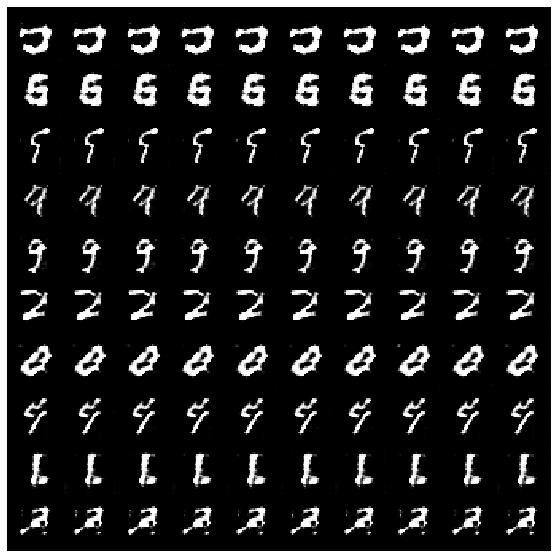

[ 3525/ 7812]	Loss_D: 0.5887	Loss_G: 2.4253	D(x): 0.8069	D(G(z)): 0.1612
[ 3550/ 7812]	Loss_D: 0.2617	Loss_G: 4.4963	D(x): 0.9571	D(G(z)): 0.1864
[ 3575/ 7812]	Loss_D: 1.5010	Loss_G: 3.7184	D(x): 0.9695	D(G(z)): 0.7489
[ 3600/ 7812]	Loss_D: 0.7074	Loss_G: 4.2774	D(x): 0.8735	D(G(z)): 0.3670


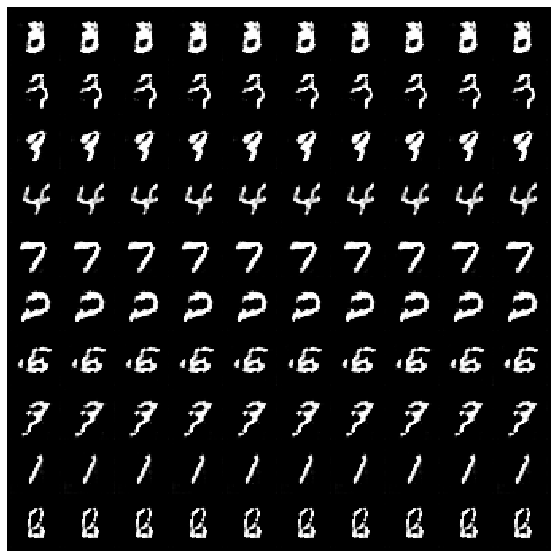

[ 3625/ 7812]	Loss_D: 0.4853	Loss_G: 4.3461	D(x): 0.8670	D(G(z)): 0.2096
[ 3650/ 7812]	Loss_D: 0.4266	Loss_G: 1.4036	D(x): 0.8072	D(G(z)): 0.0894
[ 3675/ 7812]	Loss_D: 0.5688	Loss_G: 1.9312	D(x): 0.7045	D(G(z)): 0.0421
[ 3700/ 7812]	Loss_D: 0.3751	Loss_G: 3.3660	D(x): 0.8492	D(G(z)): 0.1307


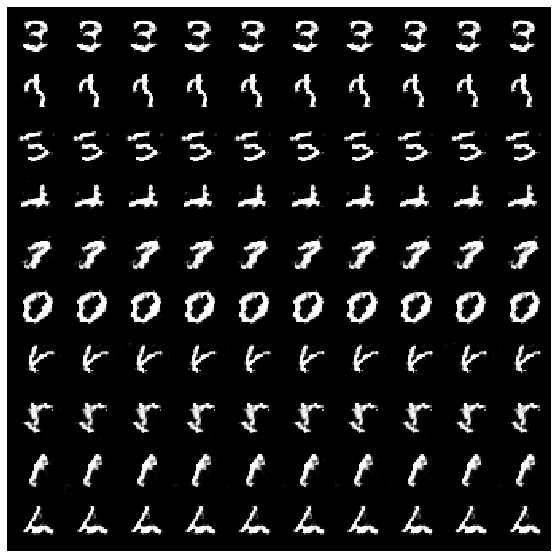

[ 3725/ 7812]	Loss_D: 1.0258	Loss_G: 3.8926	D(x): 0.8965	D(G(z)): 0.5479
[ 3750/ 7812]	Loss_D: 0.5785	Loss_G: 3.9156	D(x): 0.7879	D(G(z)): 0.1793
[ 3775/ 7812]	Loss_D: 0.5068	Loss_G: 2.1227	D(x): 0.7942	D(G(z)): 0.0888
[ 3800/ 7812]	Loss_D: 0.4182	Loss_G: 1.7494	D(x): 0.8118	D(G(z)): 0.1288


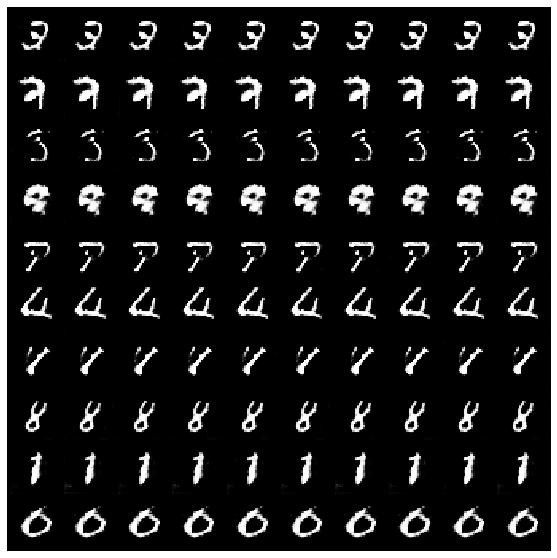

[ 3825/ 7812]	Loss_D: 0.3189	Loss_G: 3.4867	D(x): 0.8434	D(G(z)): 0.0633
[ 3850/ 7812]	Loss_D: 0.5681	Loss_G: 3.5509	D(x): 0.8447	D(G(z)): 0.2560
[ 3875/ 7812]	Loss_D: 0.6315	Loss_G: 1.2887	D(x): 0.7038	D(G(z)): 0.0803
[ 3900/ 7812]	Loss_D: 0.5097	Loss_G: 2.1463	D(x): 0.8661	D(G(z)): 0.2673


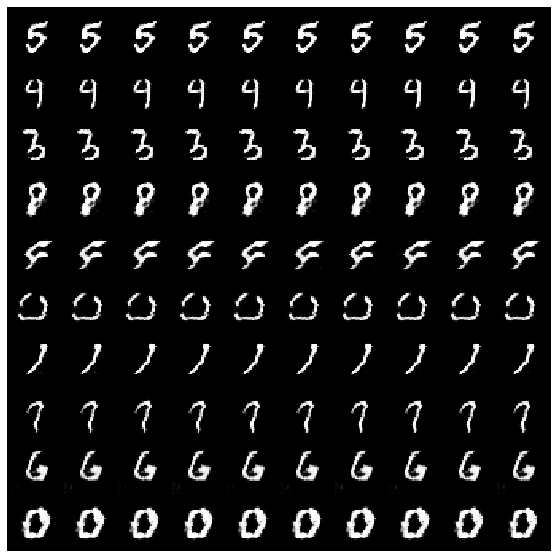

[ 3925/ 7812]	Loss_D: 0.4423	Loss_G: 3.9902	D(x): 0.7853	D(G(z)): 0.0890
[ 3950/ 7812]	Loss_D: 0.4066	Loss_G: 2.0378	D(x): 0.8503	D(G(z)): 0.1414
[ 3975/ 7812]	Loss_D: 0.5732	Loss_G: 3.9455	D(x): 0.9368	D(G(z)): 0.3589
[ 4000/ 7812]	Loss_D: 0.5101	Loss_G: 2.7228	D(x): 0.7750	D(G(z)): 0.0906


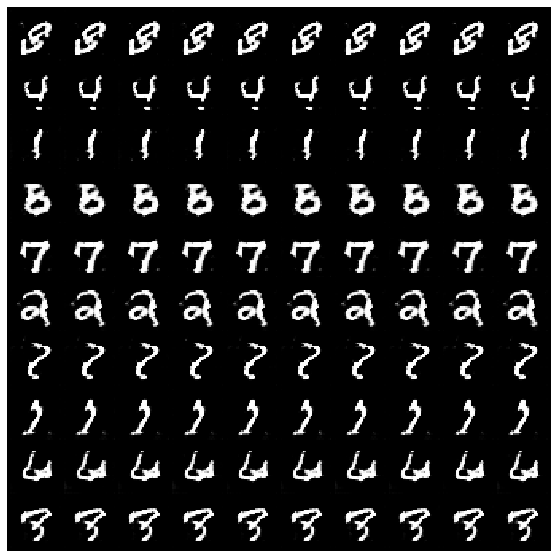

[ 4025/ 7812]	Loss_D: 0.7627	Loss_G: 3.5168	D(x): 0.7857	D(G(z)): 0.2511
[ 4050/ 7812]	Loss_D: 0.4692	Loss_G: 1.7399	D(x): 0.8089	D(G(z)): 0.1329
[ 4075/ 7812]	Loss_D: 0.3934	Loss_G: 3.9313	D(x): 0.8878	D(G(z)): 0.1946
[ 4100/ 7812]	Loss_D: 0.2958	Loss_G: 3.6463	D(x): 0.8471	D(G(z)): 0.0352


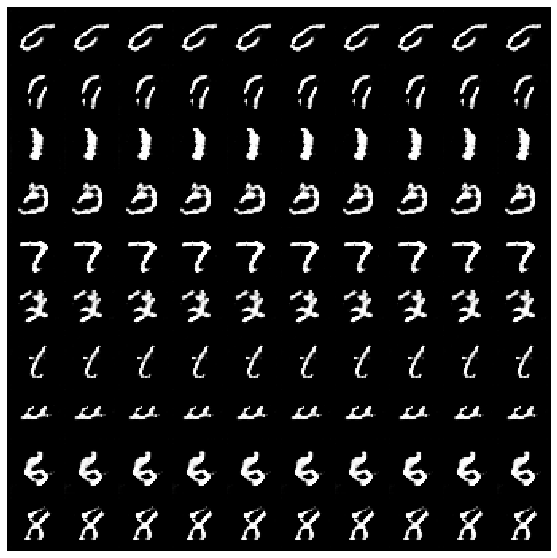

[ 4125/ 7812]	Loss_D: 0.5331	Loss_G: 1.7080	D(x): 0.7622	D(G(z)): 0.0716
[ 4150/ 7812]	Loss_D: 0.6642	Loss_G: 2.5360	D(x): 0.7721	D(G(z)): 0.1538
[ 4175/ 7812]	Loss_D: 0.4651	Loss_G: 2.2200	D(x): 0.8373	D(G(z)): 0.1869
[ 4200/ 7812]	Loss_D: 0.5917	Loss_G: 4.0257	D(x): 0.9292	D(G(z)): 0.3517


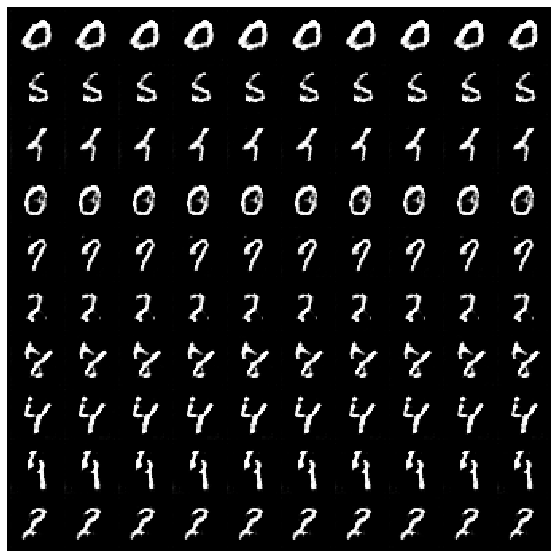

[ 4225/ 7812]	Loss_D: 0.5041	Loss_G: 3.6553	D(x): 0.7627	D(G(z)): 0.0577
[ 4250/ 7812]	Loss_D: 0.4890	Loss_G: 3.0940	D(x): 0.8357	D(G(z)): 0.2007
[ 4275/ 7812]	Loss_D: 0.5226	Loss_G: 3.0534	D(x): 0.8360	D(G(z)): 0.2081
learning rate change!
[ 4300/ 7812]	Loss_D: 0.5023	Loss_G: 2.0624	D(x): 0.7911	D(G(z)): 0.1427


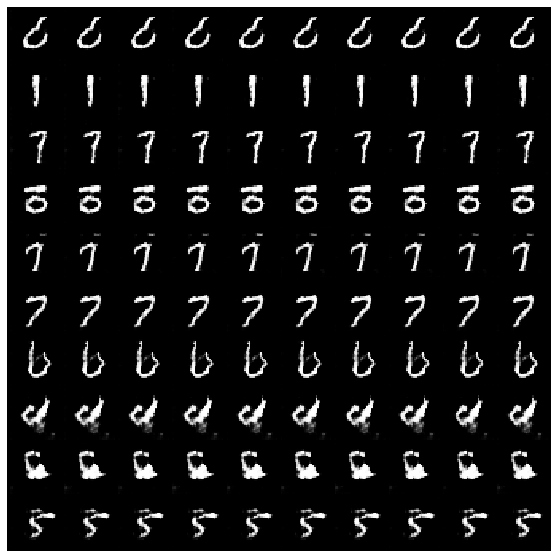

[ 4325/ 7812]	Loss_D: 0.2877	Loss_G: 2.2192	D(x): 0.9155	D(G(z)): 0.1608
[ 4350/ 7812]	Loss_D: 0.2013	Loss_G: 2.5052	D(x): 0.9438	D(G(z)): 0.1260
[ 4375/ 7812]	Loss_D: 0.1831	Loss_G: 2.7857	D(x): 0.9199	D(G(z)): 0.0778
[ 4400/ 7812]	Loss_D: 0.2421	Loss_G: 2.5946	D(x): 0.8978	D(G(z)): 0.0835


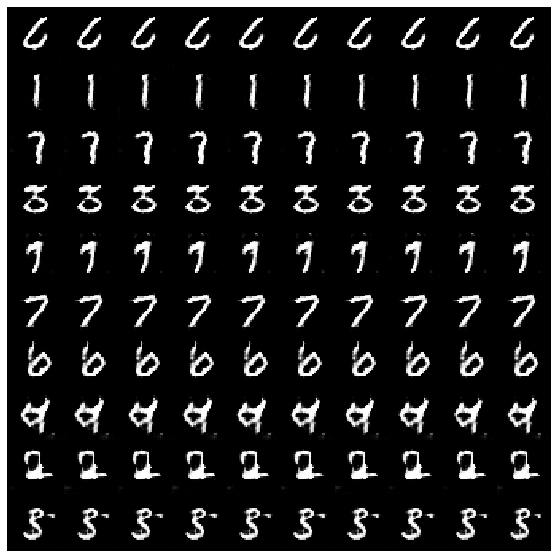

[ 4425/ 7812]	Loss_D: 0.2432	Loss_G: 2.6425	D(x): 0.8959	D(G(z)): 0.0916
[ 4450/ 7812]	Loss_D: 0.3720	Loss_G: 2.2446	D(x): 0.8322	D(G(z)): 0.1056
[ 4475/ 7812]	Loss_D: 0.2109	Loss_G: 2.8877	D(x): 0.9278	D(G(z)): 0.0793
[ 4500/ 7812]	Loss_D: 0.3017	Loss_G: 2.4669	D(x): 0.8749	D(G(z)): 0.1043


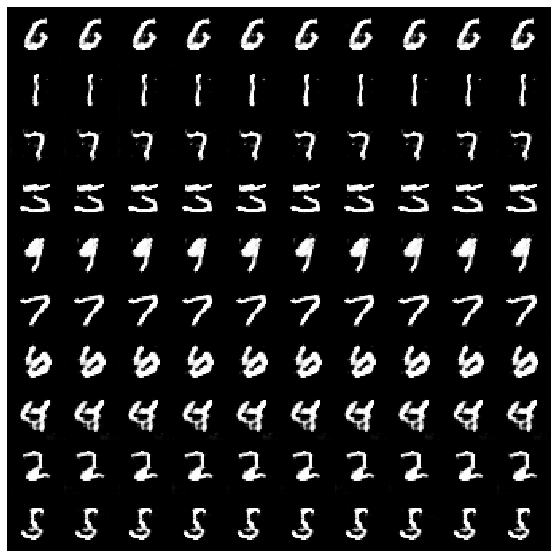

[ 4525/ 7812]	Loss_D: 0.2771	Loss_G: 2.5715	D(x): 0.8551	D(G(z)): 0.0710
[ 4550/ 7812]	Loss_D: 0.2960	Loss_G: 2.3811	D(x): 0.8872	D(G(z)): 0.0975
[ 4575/ 7812]	Loss_D: 0.2892	Loss_G: 2.1861	D(x): 0.9354	D(G(z)): 0.1840
[ 4600/ 7812]	Loss_D: 0.4709	Loss_G: 2.2525	D(x): 0.8245	D(G(z)): 0.1531


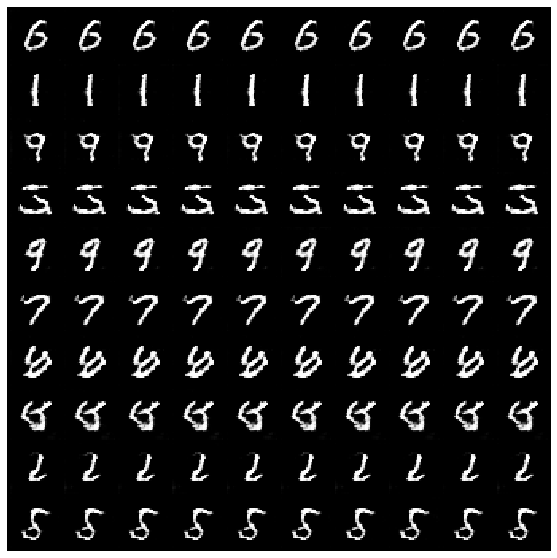

[ 4625/ 7812]	Loss_D: 0.3305	Loss_G: 2.4394	D(x): 0.8541	D(G(z)): 0.0977
[ 4650/ 7812]	Loss_D: 0.2467	Loss_G: 2.3011	D(x): 0.9171	D(G(z)): 0.1221
[ 4675/ 7812]	Loss_D: 0.2282	Loss_G: 2.5274	D(x): 0.9076	D(G(z)): 0.0889
[ 4700/ 7812]	Loss_D: 0.2503	Loss_G: 2.4668	D(x): 0.9120	D(G(z)): 0.1135


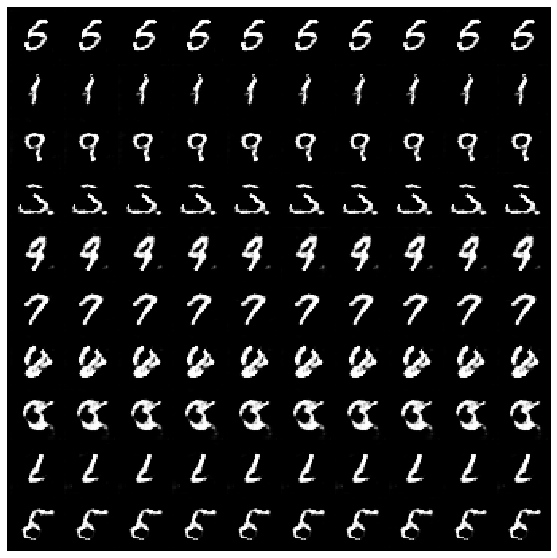

[ 4725/ 7812]	Loss_D: 0.2553	Loss_G: 2.7407	D(x): 0.8908	D(G(z)): 0.0841
[ 4750/ 7812]	Loss_D: 0.2945	Loss_G: 2.5649	D(x): 0.8905	D(G(z)): 0.1152
[ 4775/ 7812]	Loss_D: 0.2595	Loss_G: 2.5870	D(x): 0.8828	D(G(z)): 0.0710
[ 4800/ 7812]	Loss_D: 0.2510	Loss_G: 2.3018	D(x): 0.8963	D(G(z)): 0.1066


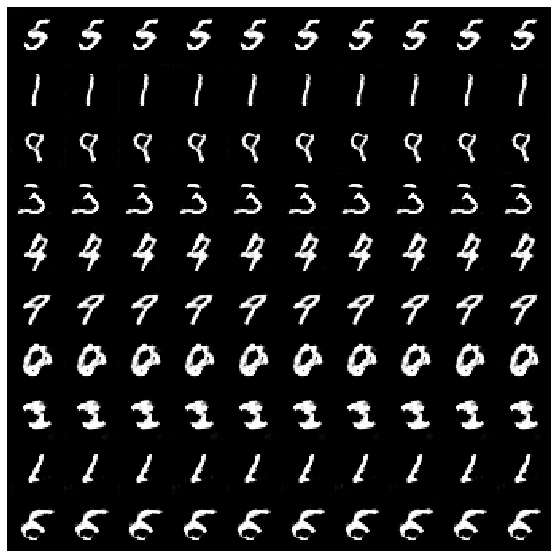

[ 4825/ 7812]	Loss_D: 0.2506	Loss_G: 2.4662	D(x): 0.9098	D(G(z)): 0.1031
[ 4850/ 7812]	Loss_D: 0.2640	Loss_G: 2.5634	D(x): 0.8880	D(G(z)): 0.0958
[ 4875/ 7812]	Loss_D: 0.3264	Loss_G: 2.3967	D(x): 0.8359	D(G(z)): 0.0832
[ 4900/ 7812]	Loss_D: 0.2721	Loss_G: 2.3556	D(x): 0.9186	D(G(z)): 0.1367


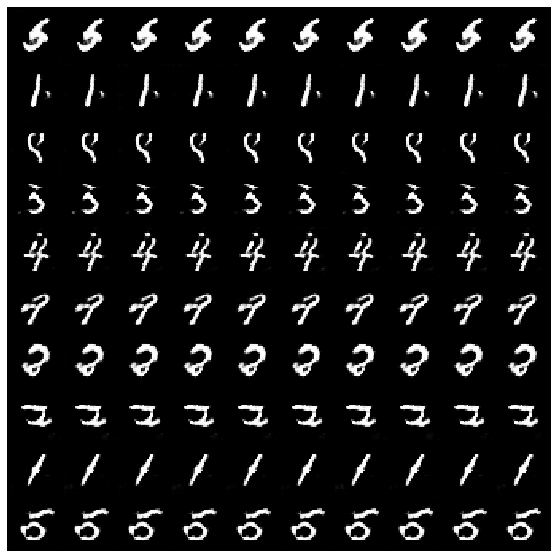

[ 4925/ 7812]	Loss_D: 0.3084	Loss_G: 2.2269	D(x): 0.8548	D(G(z)): 0.0975
[ 4950/ 7812]	Loss_D: 0.1599	Loss_G: 3.0180	D(x): 0.9420	D(G(z)): 0.0886
[ 4975/ 7812]	Loss_D: 0.1943	Loss_G: 3.0701	D(x): 0.9179	D(G(z)): 0.0742
[ 5000/ 7812]	Loss_D: 0.2007	Loss_G: 2.6762	D(x): 0.9317	D(G(z)): 0.1081


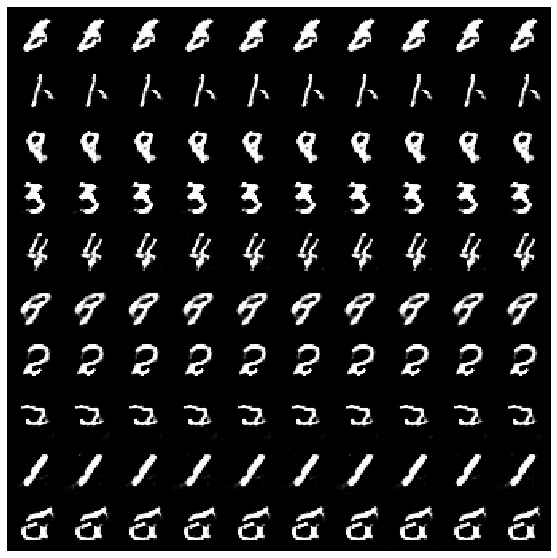

[ 5025/ 7812]	Loss_D: 0.2469	Loss_G: 2.5334	D(x): 0.9225	D(G(z)): 0.1345
[ 5050/ 7812]	Loss_D: 0.2541	Loss_G: 2.4373	D(x): 0.9005	D(G(z)): 0.1092
[ 5075/ 7812]	Loss_D: 0.1605	Loss_G: 2.7293	D(x): 0.9281	D(G(z)): 0.0667
[ 5100/ 7812]	Loss_D: 0.2101	Loss_G: 2.5272	D(x): 0.9166	D(G(z)): 0.0918


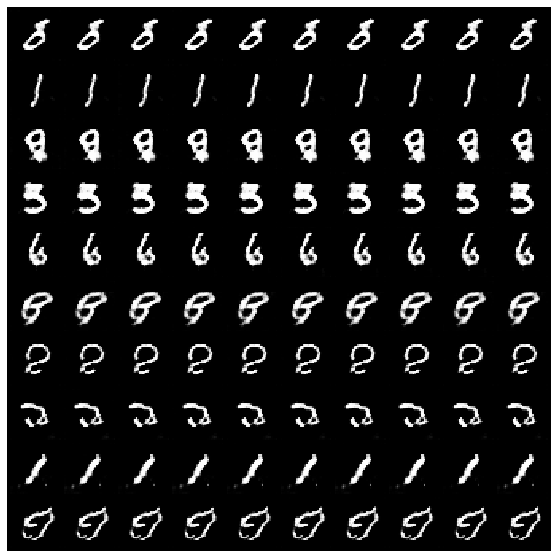

[ 5125/ 7812]	Loss_D: 0.2748	Loss_G: 2.6661	D(x): 0.8712	D(G(z)): 0.0820
[ 5150/ 7812]	Loss_D: 0.2211	Loss_G: 3.0543	D(x): 0.9005	D(G(z)): 0.0534
[ 5175/ 7812]	Loss_D: 0.2242	Loss_G: 2.6274	D(x): 0.9236	D(G(z)): 0.1126
[ 5200/ 7812]	Loss_D: 0.1828	Loss_G: 2.5633	D(x): 0.9327	D(G(z)): 0.0889


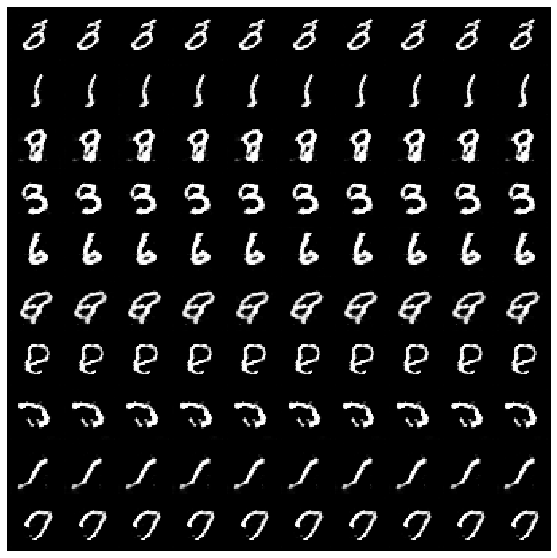

[ 5225/ 7812]	Loss_D: 0.2486	Loss_G: 2.5943	D(x): 0.9184	D(G(z)): 0.1251
[ 5250/ 7812]	Loss_D: 0.3130	Loss_G: 2.3915	D(x): 0.9092	D(G(z)): 0.1741
[ 5275/ 7812]	Loss_D: 0.3058	Loss_G: 2.1425	D(x): 0.9004	D(G(z)): 0.1609
[ 5300/ 7812]	Loss_D: 0.4697	Loss_G: 1.7644	D(x): 0.8982	D(G(z)): 0.2676


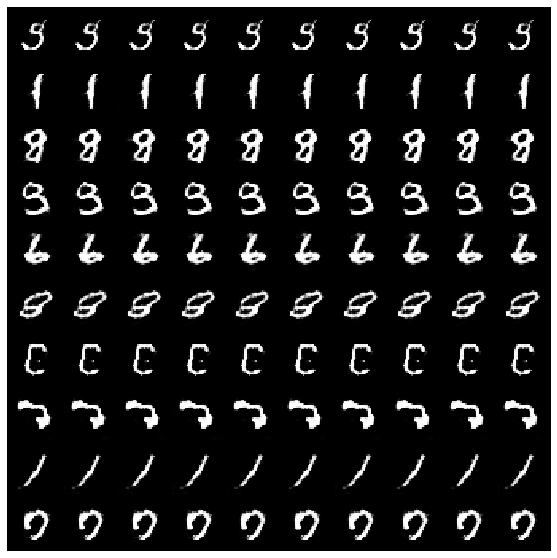

[ 5325/ 7812]	Loss_D: 0.2914	Loss_G: 2.2198	D(x): 0.8708	D(G(z)): 0.0970
[ 5350/ 7812]	Loss_D: 0.2932	Loss_G: 2.4830	D(x): 0.8849	D(G(z)): 0.1177
[ 5375/ 7812]	Loss_D: 0.2573	Loss_G: 2.4303	D(x): 0.8786	D(G(z)): 0.0817
[ 5400/ 7812]	Loss_D: 0.1849	Loss_G: 2.9484	D(x): 0.9028	D(G(z)): 0.0496


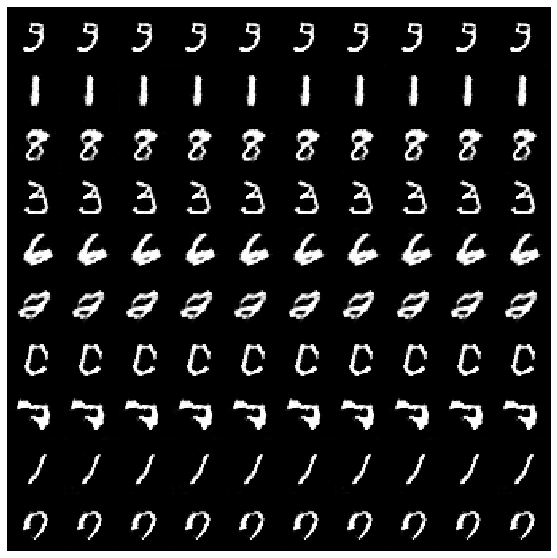

[ 5425/ 7812]	Loss_D: 0.2604	Loss_G: 2.7639	D(x): 0.8859	D(G(z)): 0.0743
[ 5450/ 7812]	Loss_D: 0.2285	Loss_G: 2.5872	D(x): 0.9199	D(G(z)): 0.1058
[ 5475/ 7812]	Loss_D: 0.3106	Loss_G: 2.9189	D(x): 0.8538	D(G(z)): 0.0425
[ 5500/ 7812]	Loss_D: 0.3125	Loss_G: 2.5239	D(x): 0.8934	D(G(z)): 0.1344


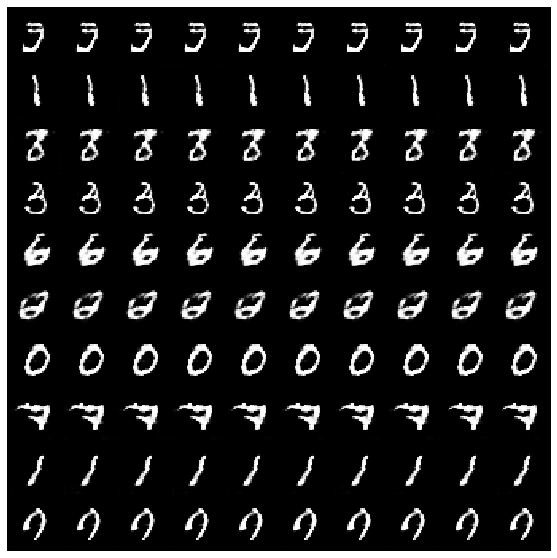

[ 5525/ 7812]	Loss_D: 0.2557	Loss_G: 2.7869	D(x): 0.8948	D(G(z)): 0.0954
[ 5550/ 7812]	Loss_D: 0.3611	Loss_G: 2.4030	D(x): 0.8871	D(G(z)): 0.1522
[ 5575/ 7812]	Loss_D: 0.3048	Loss_G: 2.5045	D(x): 0.8635	D(G(z)): 0.0833
[ 5600/ 7812]	Loss_D: 0.2664	Loss_G: 2.5573	D(x): 0.9052	D(G(z)): 0.1285


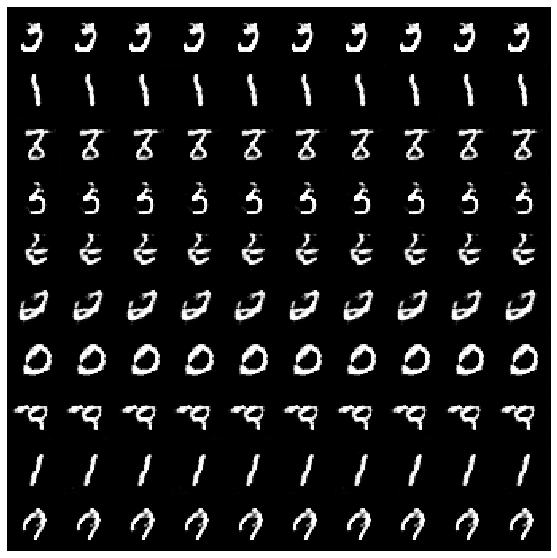

[ 5625/ 7812]	Loss_D: 0.2733	Loss_G: 2.3500	D(x): 0.9107	D(G(z)): 0.1399
[ 5650/ 7812]	Loss_D: 0.3259	Loss_G: 2.5433	D(x): 0.8572	D(G(z)): 0.1081
[ 5675/ 7812]	Loss_D: 0.3594	Loss_G: 2.1644	D(x): 0.8919	D(G(z)): 0.1805
[ 5700/ 7812]	Loss_D: 0.4007	Loss_G: 2.0686	D(x): 0.8613	D(G(z)): 0.1746


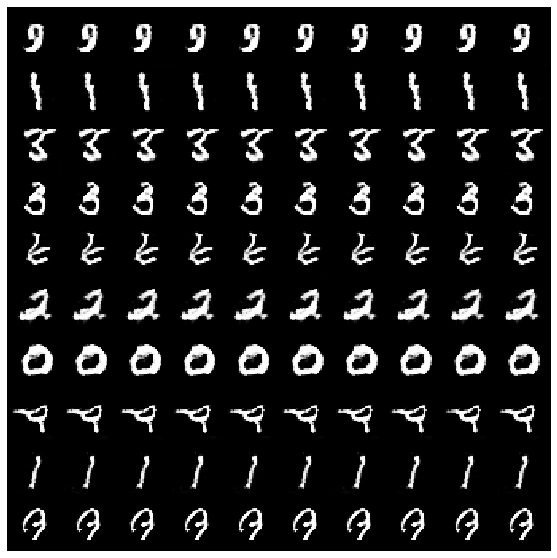

[ 5725/ 7812]	Loss_D: 0.2826	Loss_G: 2.3188	D(x): 0.8687	D(G(z)): 0.0859
[ 5750/ 7812]	Loss_D: 0.2348	Loss_G: 2.6661	D(x): 0.9028	D(G(z)): 0.0940
[ 5775/ 7812]	Loss_D: 0.2565	Loss_G: 2.7201	D(x): 0.8984	D(G(z)): 0.1108
[ 5800/ 7812]	Loss_D: 0.2478	Loss_G: 2.4710	D(x): 0.9113	D(G(z)): 0.1138


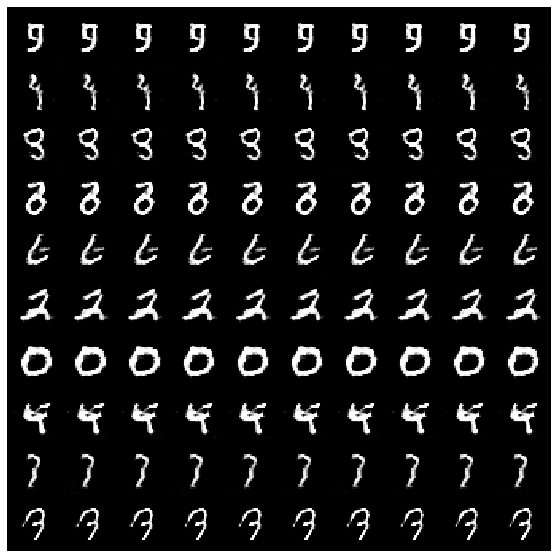

[ 5825/ 7812]	Loss_D: 0.2495	Loss_G: 2.2263	D(x): 0.9553	D(G(z)): 0.1650
[ 5850/ 7812]	Loss_D: 0.2228	Loss_G: 2.6440	D(x): 0.9012	D(G(z)): 0.0782
[ 5875/ 7812]	Loss_D: 0.3345	Loss_G: 2.4172	D(x): 0.8607	D(G(z)): 0.1026
[ 5900/ 7812]	Loss_D: 0.2278	Loss_G: 2.3763	D(x): 0.9511	D(G(z)): 0.1490


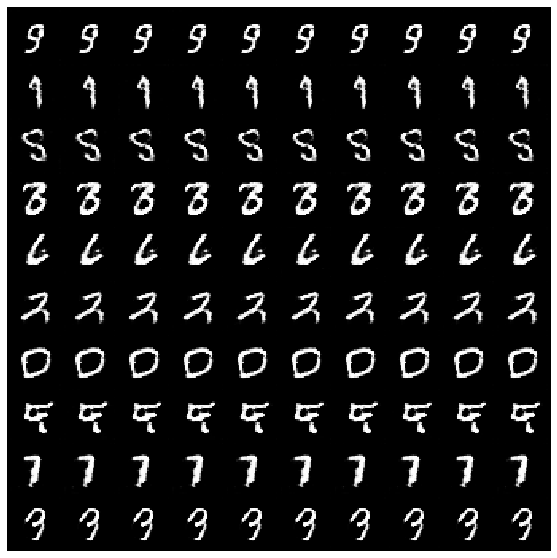

[ 5925/ 7812]	Loss_D: 0.2137	Loss_G: 2.6795	D(x): 0.9389	D(G(z)): 0.1271
[ 5950/ 7812]	Loss_D: 0.1893	Loss_G: 3.1329	D(x): 0.9201	D(G(z)): 0.0780
[ 5975/ 7812]	Loss_D: 0.3506	Loss_G: 2.0213	D(x): 0.8607	D(G(z)): 0.1212
[ 6000/ 7812]	Loss_D: 0.2958	Loss_G: 2.6064	D(x): 0.9036	D(G(z)): 0.1423


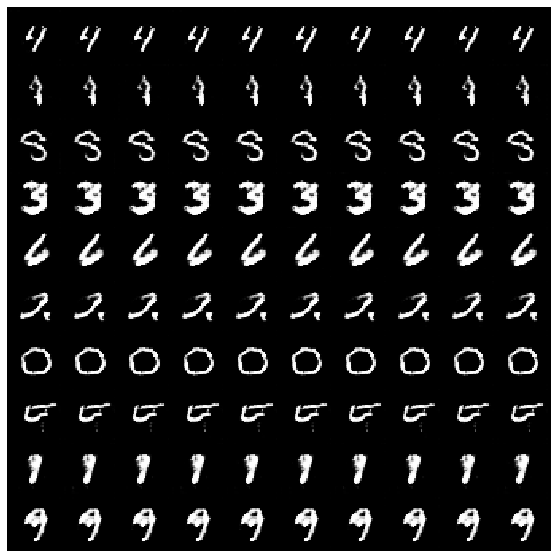

[ 6025/ 7812]	Loss_D: 0.2688	Loss_G: 2.1436	D(x): 0.8798	D(G(z)): 0.1021
[ 6050/ 7812]	Loss_D: 0.2802	Loss_G: 2.3891	D(x): 0.8638	D(G(z)): 0.0831
[ 6075/ 7812]	Loss_D: 0.1870	Loss_G: 3.1326	D(x): 0.9140	D(G(z)): 0.0759
[ 6100/ 7812]	Loss_D: 0.2962	Loss_G: 2.7787	D(x): 0.8992	D(G(z)): 0.1135


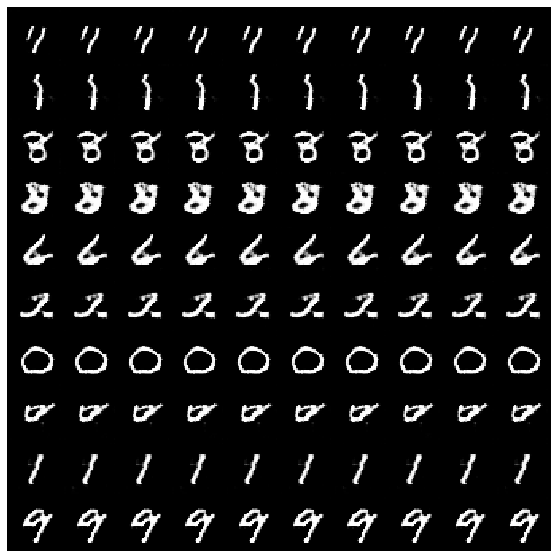

[ 6125/ 7812]	Loss_D: 0.2520	Loss_G: 2.6613	D(x): 0.8979	D(G(z)): 0.0743
[ 6150/ 7812]	Loss_D: 0.3012	Loss_G: 2.3574	D(x): 0.8977	D(G(z)): 0.1186
[ 6175/ 7812]	Loss_D: 0.2746	Loss_G: 2.8505	D(x): 0.8565	D(G(z)): 0.0617
[ 6200/ 7812]	Loss_D: 0.3122	Loss_G: 2.4938	D(x): 0.8863	D(G(z)): 0.1331


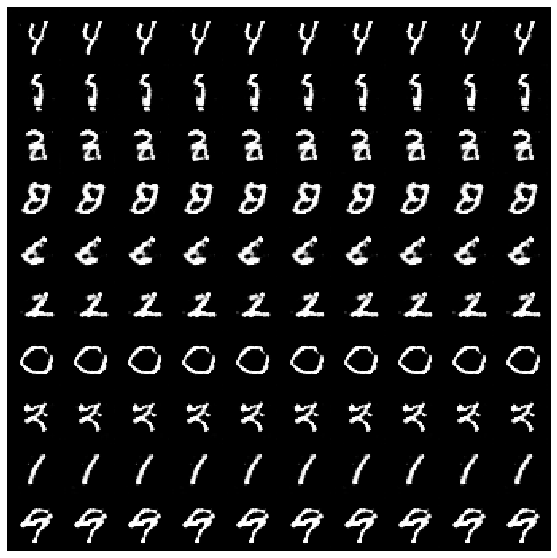

[ 6225/ 7812]	Loss_D: 0.1768	Loss_G: 2.5651	D(x): 0.9291	D(G(z)): 0.0793
learning rate change!
[ 6250/ 7812]	Loss_D: 0.2835	Loss_G: 2.6565	D(x): 0.8795	D(G(z)): 0.0761
[ 6275/ 7812]	Loss_D: 0.1990	Loss_G: 2.5860	D(x): 0.9146	D(G(z)): 0.0870
[ 6300/ 7812]	Loss_D: 0.2258	Loss_G: 2.1490	D(x): 0.9434	D(G(z)): 0.1385


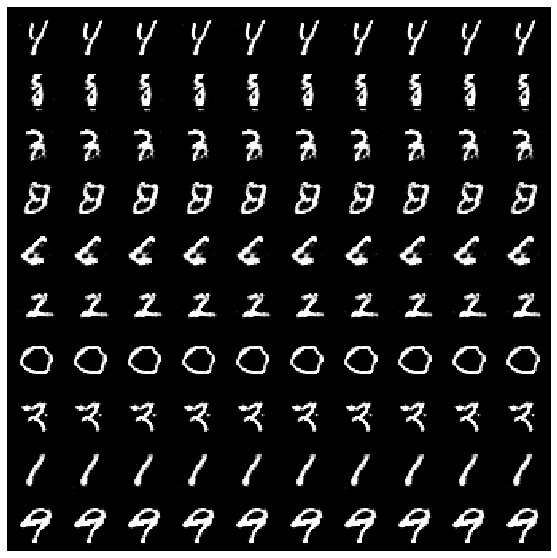

[ 6325/ 7812]	Loss_D: 0.2231	Loss_G: 2.7818	D(x): 0.9120	D(G(z)): 0.0715
[ 6350/ 7812]	Loss_D: 0.2162	Loss_G: 2.7641	D(x): 0.8970	D(G(z)): 0.0706
[ 6375/ 7812]	Loss_D: 0.2142	Loss_G: 2.6302	D(x): 0.9176	D(G(z)): 0.0840
[ 6400/ 7812]	Loss_D: 0.2386	Loss_G: 2.3543	D(x): 0.9188	D(G(z)): 0.1087


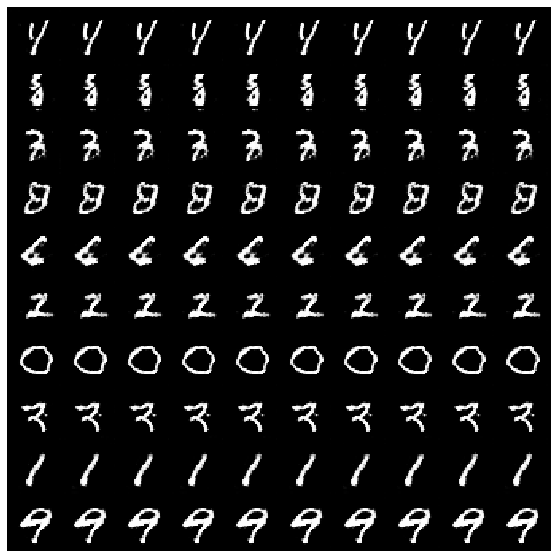

[ 6425/ 7812]	Loss_D: 0.2279	Loss_G: 2.4544	D(x): 0.9226	D(G(z)): 0.1085
[ 6450/ 7812]	Loss_D: 0.1893	Loss_G: 2.6228	D(x): 0.9251	D(G(z)): 0.0870
[ 6475/ 7812]	Loss_D: 0.2240	Loss_G: 2.5536	D(x): 0.9020	D(G(z)): 0.0847
[ 6500/ 7812]	Loss_D: 0.3035	Loss_G: 2.4325	D(x): 0.8715	D(G(z)): 0.0952


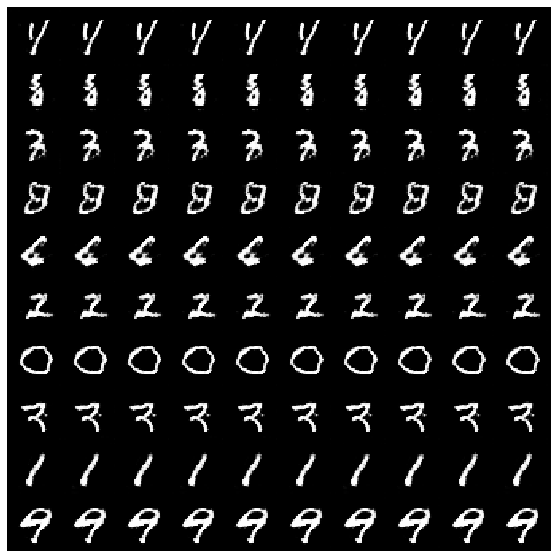

[ 6525/ 7812]	Loss_D: 0.2396	Loss_G: 2.7570	D(x): 0.8939	D(G(z)): 0.0673
[ 6550/ 7812]	Loss_D: 0.1976	Loss_G: 2.5992	D(x): 0.9167	D(G(z)): 0.0827
[ 6575/ 7812]	Loss_D: 0.2091	Loss_G: 2.5691	D(x): 0.9171	D(G(z)): 0.0917
[ 6600/ 7812]	Loss_D: 0.3069	Loss_G: 2.0314	D(x): 0.8958	D(G(z)): 0.1482


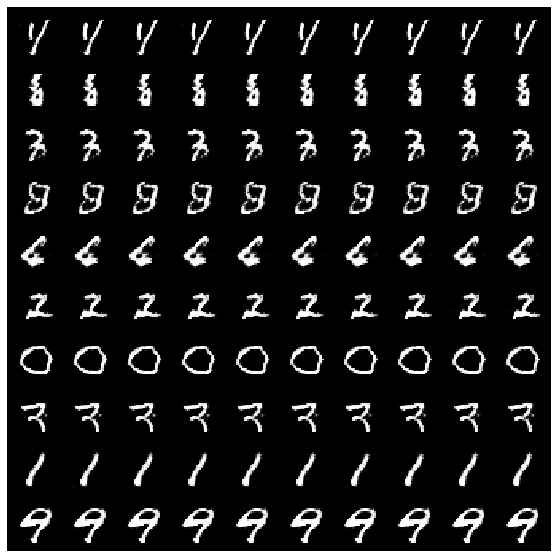

[ 6625/ 7812]	Loss_D: 0.2950	Loss_G: 2.6420	D(x): 0.8704	D(G(z)): 0.0798
[ 6650/ 7812]	Loss_D: 0.1580	Loss_G: 2.8870	D(x): 0.9302	D(G(z)): 0.0687
[ 6675/ 7812]	Loss_D: 0.2741	Loss_G: 2.5434	D(x): 0.8915	D(G(z)): 0.0900
[ 6700/ 7812]	Loss_D: 0.2443	Loss_G: 2.3437	D(x): 0.8956	D(G(z)): 0.1040


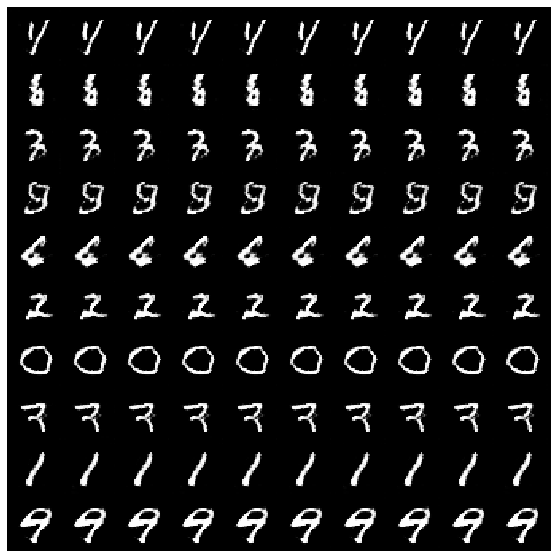

[ 6725/ 7812]	Loss_D: 0.1732	Loss_G: 2.7921	D(x): 0.9199	D(G(z)): 0.0723
[ 6750/ 7812]	Loss_D: 0.2955	Loss_G: 2.1360	D(x): 0.8981	D(G(z)): 0.1340
[ 6775/ 7812]	Loss_D: 0.2404	Loss_G: 2.4803	D(x): 0.9058	D(G(z)): 0.0973
[ 6800/ 7812]	Loss_D: 0.2420	Loss_G: 2.5629	D(x): 0.8839	D(G(z)): 0.0818


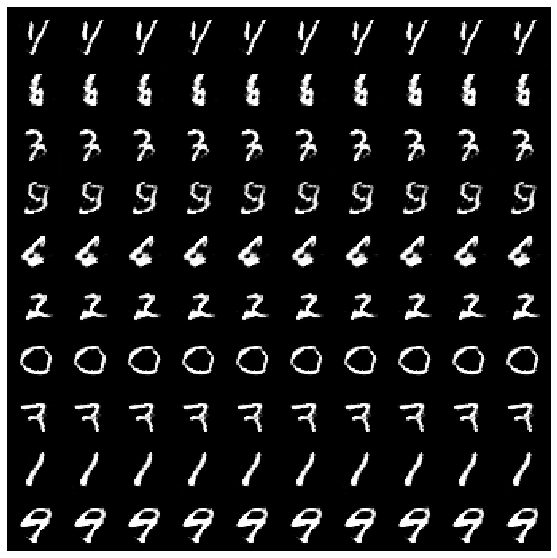

[ 6825/ 7812]	Loss_D: 0.2489	Loss_G: 2.1849	D(x): 0.9170	D(G(z)): 0.1259
[ 6850/ 7812]	Loss_D: 0.2710	Loss_G: 2.4886	D(x): 0.8922	D(G(z)): 0.0920
[ 6875/ 7812]	Loss_D: 0.2167	Loss_G: 2.3840	D(x): 0.9169	D(G(z)): 0.1038
[ 6900/ 7812]	Loss_D: 0.2853	Loss_G: 2.3543	D(x): 0.8719	D(G(z)): 0.0990


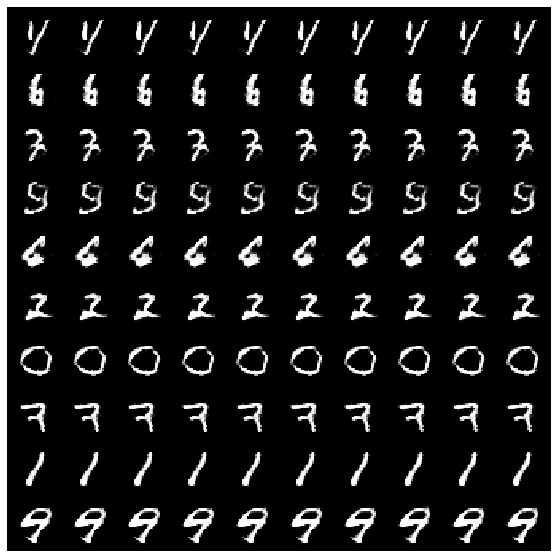

[ 6925/ 7812]	Loss_D: 0.2502	Loss_G: 2.3858	D(x): 0.8994	D(G(z)): 0.1044
[ 6950/ 7812]	Loss_D: 0.2845	Loss_G: 2.1532	D(x): 0.8947	D(G(z)): 0.1216
[ 6975/ 7812]	Loss_D: 0.2526	Loss_G: 2.5030	D(x): 0.8921	D(G(z)): 0.0948
[ 7000/ 7812]	Loss_D: 0.3027	Loss_G: 2.2598	D(x): 0.8757	D(G(z)): 0.1071


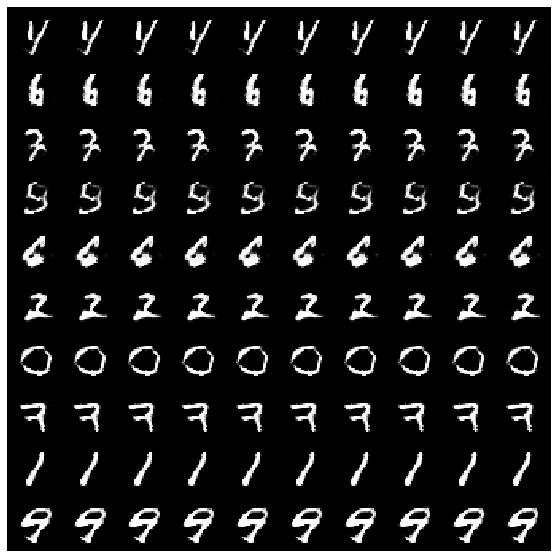

[ 7025/ 7812]	Loss_D: 0.3339	Loss_G: 2.4895	D(x): 0.8607	D(G(z)): 0.0867
[ 7050/ 7812]	Loss_D: 0.2561	Loss_G: 2.2927	D(x): 0.9034	D(G(z)): 0.1083
[ 7075/ 7812]	Loss_D: 0.2786	Loss_G: 2.3896	D(x): 0.8879	D(G(z)): 0.0945
[ 7100/ 7812]	Loss_D: 0.2336	Loss_G: 2.3838	D(x): 0.9072	D(G(z)): 0.1022


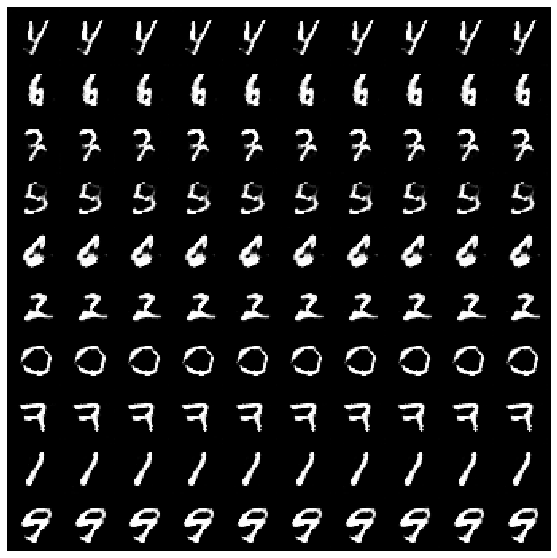

[ 7125/ 7812]	Loss_D: 0.2040	Loss_G: 2.5177	D(x): 0.9133	D(G(z)): 0.0882
[ 7150/ 7812]	Loss_D: 0.2923	Loss_G: 2.3670	D(x): 0.8892	D(G(z)): 0.1011
[ 7175/ 7812]	Loss_D: 0.2440	Loss_G: 2.2585	D(x): 0.9122	D(G(z)): 0.1149
[ 7200/ 7812]	Loss_D: 0.2095	Loss_G: 2.2592	D(x): 0.9360	D(G(z)): 0.1167


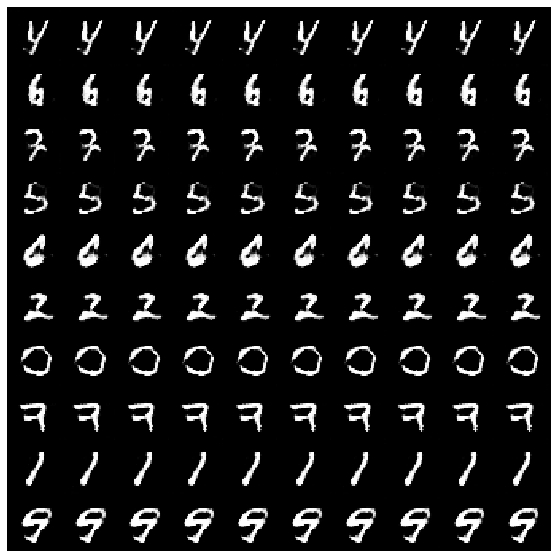

[ 7225/ 7812]	Loss_D: 0.2619	Loss_G: 2.3023	D(x): 0.9130	D(G(z)): 0.1118
[ 7250/ 7812]	Loss_D: 0.2598	Loss_G: 2.4382	D(x): 0.8985	D(G(z)): 0.0884
[ 7275/ 7812]	Loss_D: 0.2508	Loss_G: 2.6311	D(x): 0.8894	D(G(z)): 0.0787
[ 7300/ 7812]	Loss_D: 0.2054	Loss_G: 2.5227	D(x): 0.9118	D(G(z)): 0.0813


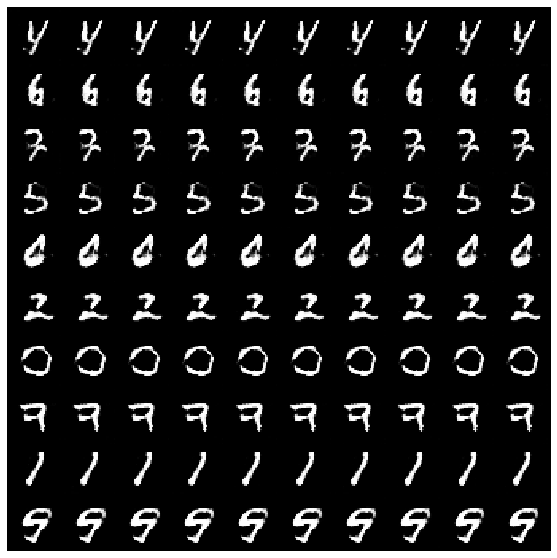

[ 7325/ 7812]	Loss_D: 0.2267	Loss_G: 2.8310	D(x): 0.8815	D(G(z)): 0.0622
[ 7350/ 7812]	Loss_D: 0.2136	Loss_G: 2.2154	D(x): 0.9357	D(G(z)): 0.1207
[ 7375/ 7812]	Loss_D: 0.3620	Loss_G: 2.4051	D(x): 0.8732	D(G(z)): 0.1003
[ 7400/ 7812]	Loss_D: 0.2158	Loss_G: 2.3086	D(x): 0.9225	D(G(z)): 0.1125


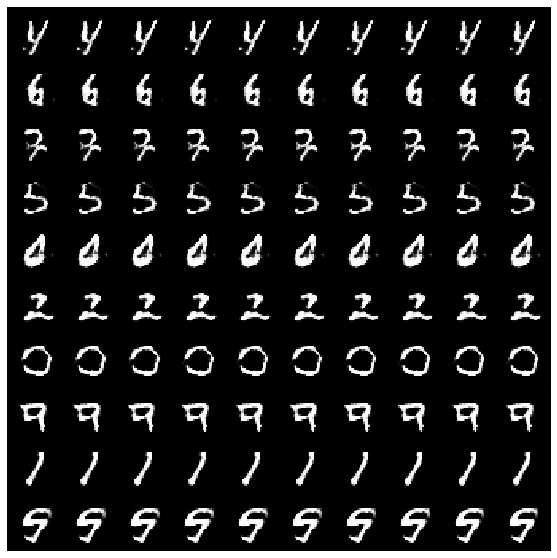

[ 7425/ 7812]	Loss_D: 0.2037	Loss_G: 2.5264	D(x): 0.9157	D(G(z)): 0.0863
[ 7450/ 7812]	Loss_D: 0.1727	Loss_G: 2.5807	D(x): 0.9298	D(G(z)): 0.0789
[ 7475/ 7812]	Loss_D: 0.2185	Loss_G: 2.6513	D(x): 0.9156	D(G(z)): 0.0760
[ 7500/ 7812]	Loss_D: 0.2843	Loss_G: 2.5844	D(x): 0.8799	D(G(z)): 0.0759


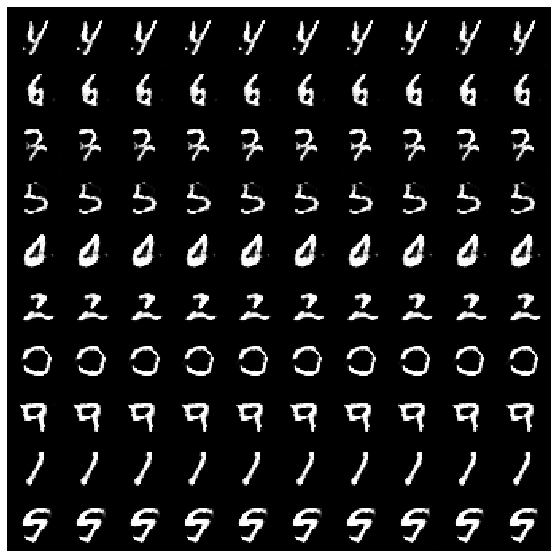

[ 7525/ 7812]	Loss_D: 0.2205	Loss_G: 2.4847	D(x): 0.9251	D(G(z)): 0.0876
[ 7550/ 7812]	Loss_D: 0.1685	Loss_G: 2.7902	D(x): 0.9232	D(G(z)): 0.0667
[ 7575/ 7812]	Loss_D: 0.1610	Loss_G: 2.6615	D(x): 0.9398	D(G(z)): 0.0755
[ 7600/ 7812]	Loss_D: 0.1772	Loss_G: 2.4658	D(x): 0.9445	D(G(z)): 0.0946


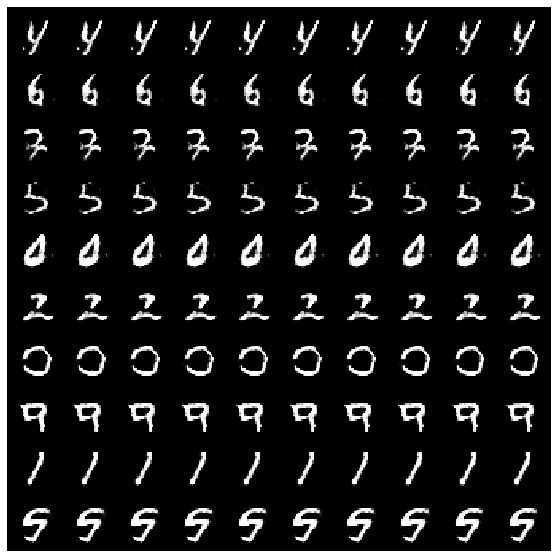

[ 7625/ 7812]	Loss_D: 0.2143	Loss_G: 2.8372	D(x): 0.8931	D(G(z)): 0.0649
[ 7650/ 7812]	Loss_D: 0.1540	Loss_G: 2.6770	D(x): 0.9474	D(G(z)): 0.0776
[ 7675/ 7812]	Loss_D: 0.1990	Loss_G: 2.5509	D(x): 0.9135	D(G(z)): 0.0814
[ 7700/ 7812]	Loss_D: 0.1612	Loss_G: 2.6445	D(x): 0.9332	D(G(z)): 0.0775


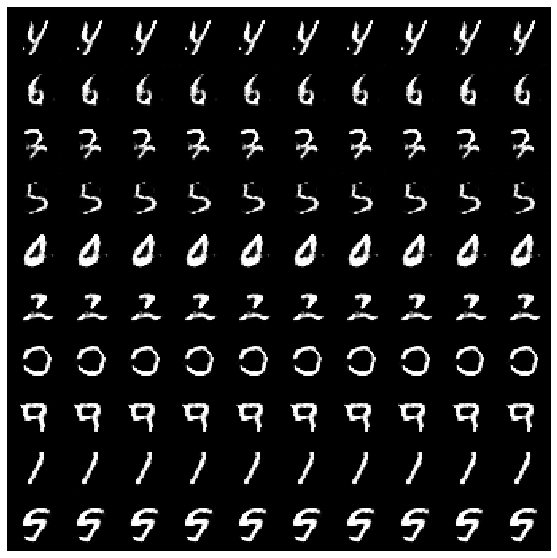

[ 7725/ 7812]	Loss_D: 0.1435	Loss_G: 2.6450	D(x): 0.9465	D(G(z)): 0.0745
[ 7750/ 7812]	Loss_D: 0.1718	Loss_G: 2.6737	D(x): 0.9307	D(G(z)): 0.0732
[ 7775/ 7812]	Loss_D: 0.2013	Loss_G: 2.5375	D(x): 0.9178	D(G(z)): 0.0864
[ 7800/ 7812]	Loss_D: 0.2100	Loss_G: 2.6021	D(x): 0.9375	D(G(z)): 0.0835


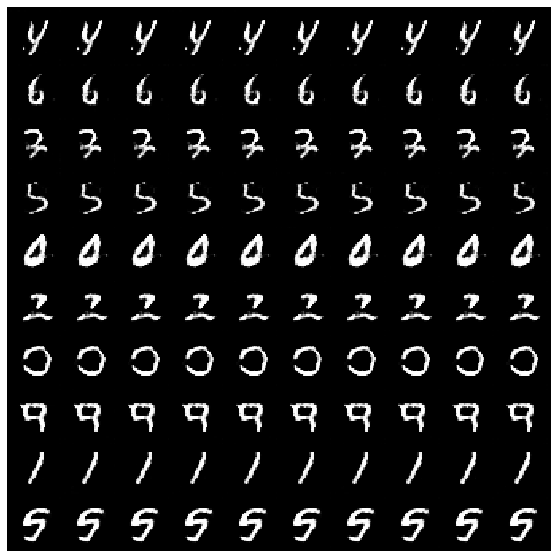

In [12]:
for i in range(steps):
    
    if i == steps_per_epoch * 11:
        optimizerG.param_groups[0]['lr'] /= 10
        optimizerD.param_groups[0]['lr'] /= 10
        print("learning rate change!")
        
    if i == steps_per_epoch * 16:
        optimizerG.param_groups[0]['lr'] /= 10
        optimizerD.param_groups[0]['lr'] /= 10
        print("learning rate change!")
    
    ########
    # Update D network: maximize log(D(x)) + log(1 - D(G(z)))
    for _ in range(nb_update_D):
        netD.zero_grad()
        optimizerD.zero_grad()
        
        # Create batches
        x_real, y_real, r_real = get_batch_real()
        x_fake, y_fake, r_fake = get_batch_fake(y_real)
        
        # Forward 
        r_hat_real =netD(x_real,y_real)
        r_hat_fake = netD(x_fake, y_fake)
        errD = (criterion(r_hat_real,r_real)+criterion(r_hat_fake,r_fake)).sum()
        
        # Backward
        # TODO backward & optimization step on D
        errD.backward()
        optimizerD.step()

        
        # Compute / save metrics
        avg_output_for_real = r_hat_real.mean().item()
        avg_output_for_fake = r_hat_fake.mean().item()    
        D_losses.append(errD.item())



    ########
    # Update G network: maximize log(D(G(z)))
    for _ in range(nb_update_G):
        netG.zero_grad()
        optimizerG.zero_grad()

        x_fake, y_fake, r_fake = get_batch_fake(y_real, train_G=True)
        r_hat=netD(x_fake,y_fake)

        errG=criterion(r_hat,r_fake).sum()
        errG.backward()
        optimizerG.step()
        # Compute / save metrics
        G_losses.append(errG.item())
        
    
    ########
    # Logs
    if i % 25 == 0:
        print('[%5d/%5d]\tLoss_D: %.4f\tLoss_G: %.4f\tD(x): %.4f\tD(G(z)): %.4f'
              % (i, steps, errD.item(), errG.item(), avg_output_for_real, avg_output_for_fake))

    if i % 100 == 0:
        with torch.no_grad():
            fixed_noise=fixed_noise.to(device)
            fixed_y=fixed_y.to(device)
            x_fake = netG(fixed_noise, fixed_y).detach().cpu()
        img_list.append(vutils.make_grid(x_fake, padding=2, normalize=True, nrow=10))
        plt.figure(figsize=(10,10))
        plt.imshow(np.transpose(img_list[-1],(1,2,0)))
        plt.axis("off")
        plt.show()

# Display training evolution

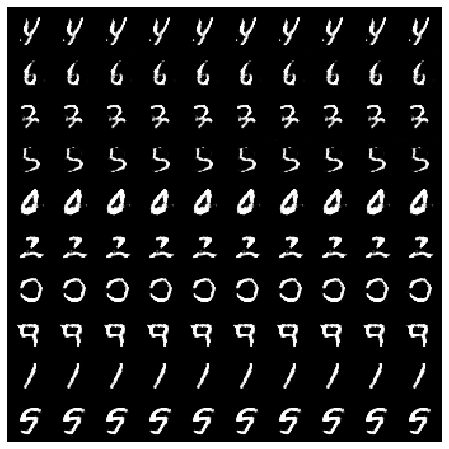

In [13]:
# Show generations
fig = plt.figure(figsize=(8,8))
plt.axis("off")
ims = [[plt.imshow(np.transpose(i,(1,2,0)), animated=True)] for i in img_list]
ani = animation.ArtistAnimation(fig, ims, interval=1000, repeat_delay=1000, blit=True)

HTML(ani.to_jshtml())

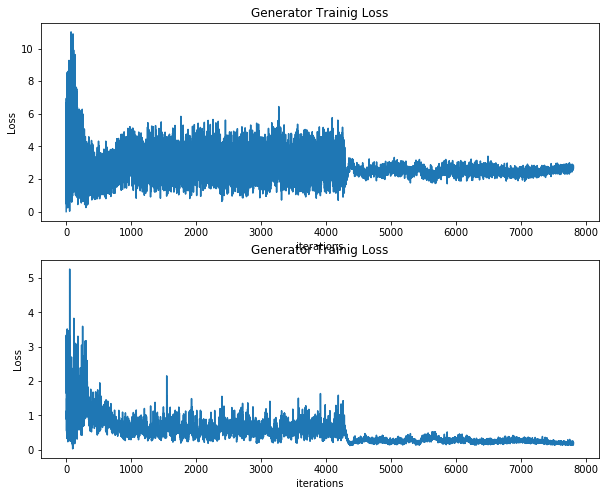

In [14]:
# Loss evolution
plt.figure(figsize=(10,8))
plt.subplot(2,1,1)
plt.title("Generator Trainig Loss")
plt.plot(G_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")

plt.subplot(2,1,2)
plt.title("Generator Trainig Loss")
plt.plot(D_losses)
plt.xlabel("iterations")
plt.ylabel("Loss")
plt.show()